# Populations creations

In this notebook, we create various populations to be used in later experiments.

In [ ]:
import sys

import json
import sys
import pandas as pd
import matplotlib.pyplot as plt

import tinytroupe
from tinytroupe.agent import TinyPerson
from tinytroupe.environment import TinyWorld
from tinytroupe.factory import TinyPersonFactory
from tinytroupe.validation import TinyPersonValidator
from tinytroupe import control

from tinytroupe.extraction import ResultsExtractor
from tinytroupe.profiling import Profiler


!!!!
DISCLAIMER: TinyTroupe relies on Artificial Intelligence (AI) models to generate content. 
The AI models are not perfect and may produce inappropriate or inacurate results. 
For any serious or consequential use, please review the generated content before using it.
!!!!

Looking for default config on: C:\Users\pdasilva\repos\TinyTroupe\tinytroupe\utils\..\config.ini
Found custom config on: c:\Users\pdasilva\OneDrive - Microsoft\TinyTroupe (shared)\Paper artifacts\Working examples\config.ini

Current TinyTroupe configuration 
[OpenAI]
api_type = azure
azure_api_version = 2024-08-01-preview
model = gpt-4o-mini
reasoning_model = o3-mini
embedding_model = text-embedding-3-small
max_tokens = 16000
temperature = 1.2
freq_penalty = 0.0
presence_penalty = 0.0
timeout = 60
max_attempts = 5
waiting_time = 0
exponential_backoff_factor = 5
reasoning_effort = high
cache_api_calls = False
cache_file_name = openai_api_cache.pickle
max_content_display_length = 1024
azure_embedding_model_api_versi

2025-04-17 19:16:38,365 - tinytroupe - DEBUG - Initializing OpenAIClient
2025-04-17 19:16:38,366 - tinytroupe - DEBUG - Initializing AzureClient
2025-04-17 19:16:38,367 - tinytroupe - DEBUG - Initializing OpenAIClient


In [2]:
from tinytroupe.profiling import Profiler

## Common parameters and functions

In [3]:
small_population_size = 5
population_size = 20
total_population_size = 30

large_population_size = 40
large_total_population_size = 60

In [4]:
def save_population(population:list, folder_path:str):
    """
    Save the population to a JSON file.
    """
    for person in population:
         person.save_specification(f"{folder_path}/{person.name}.agent.json")
    

In [5]:
def describe_population_sampling_space(nationality:str, characteristics_file_path:str=None, verbose:bool=True) -> str:
    """
    Describe the sampling space of the population.
    """

    sampling_space_description =\
        f"""
        A uniform random representative sample of people from the {nationality} population. 
        Make sure you consider very detailed, fine-grained, characteristics of the individuals in the population.
        Please consider as many different population segments as possible, while always keeping proportions correct.
        For example, instead of sampling 10 people from segment A and 5 from segment B, you can instead
        sample 2 from A, 1 from B, and 7 others from other segments, provided the proportions are maintained correct.
        """

    if characteristics_file_path:
        with open(characteristics_file_path, 'r') as file:
            characteristics = json.load(file)

        sampling_space_description +=\
            f"""
            Besides anything you know about this population, also consider the following information 
            to sample proportionally to the presence of such groups and characteristics in the population.        
            
            {json.dumps(json.loads(open(characteristics_file_path).read()), indent=4)}
            """
    
    if verbose:
        print(sampling_space_description)
    
    return sampling_space_description

         

    

We'll also use a post-processing function to further adjust the audience to our needs.

In [6]:
def post_process_agent(agent, group=None):
    pass

    # TODO do we need any of this?
    #
    ## makes agents authentic and honest. Preliminary results show that this induces agents to be a bit more realistic.
    #agent.import_fragment("./fragments/genuine.agent.fragment.json")
    #
    #if group == "families":
    #    agent.import_fragment("./fragments/loving_parent.agent.fragment.json")
    #elif group == "couples":
    #    pass # nothing for now 
    #elif group == "singles":
    #    pass # nothing for now
    #

In [7]:
profiler = Profiler()

## Population: General Western population sample

In [8]:
global_general_sampling_space_description = describe_population_sampling_space("Global")


        A uniform random representative sample of people from the Global population. 
        Make sure you consider very detailed, fine-grained, characteristics of the individuals in the population.
        Please consider as many different population segments as possible, while always keeping proportions correct.
        For example, instead of sampling 10 people from segment A and 5 from segment B, you can instead
        sample 2 from A, 1 from B, and 7 others from other segments, provided the proportions are maintained correct.
        


In [9]:
global_general_population_factory = TinyPersonFactory(sampling_space_description=global_general_sampling_space_description, 
                                                      total_population_size=total_population_size)


In [10]:
global_general_population_factory.initialize_sampling_plan()
global_general_population_factory.sampling_plan

[{'sampled_values': {'age': 25,
   'gender': 'female',
   'ethnicity': 'Caucasian',
   'socioeconomic status': 'middle',
   'geographic region': 'North America',
   'education level': 'higher education',
   'occupation': 'professional'},
  'quantity': 5},
 {'sampled_values': {'age': 30,
   'gender': 'male',
   'ethnicity': 'Black',
   'socioeconomic status': 'upper-middle',
   'geographic region': 'Europe',
   'education level': 'postgraduate education',
   'occupation': 'management'},
  'quantity': 4},
 {'sampled_values': {'age': 22,
   'gender': 'non-binary',
   'ethnicity': 'Hispanic',
   'socioeconomic status': 'lower-middle',
   'geographic region': 'South America',
   'education level': 'secondary education',
   'occupation': 'student'},
  'quantity': 3},
 {'sampled_values': {'age': 40,
   'gender': 'male',
   'ethnicity': 'Asian',
   'socioeconomic status': 'high',
   'geographic region': 'Asia',
   'education level': 'higher education',
   'occupation': 'professional'},
  'quan

In [11]:
global_general_population = global_general_population_factory.generate_people(population_size, 
                                                                             post_processing_func=post_process_agent,
                                                                             verbose=True)

Generated person 11/20: Daniel Evans is a 22 year old Student, Hispanic, currently living in Lima, Peru. Daniel Evans is not only dedicated to his studies in sociology but also embodies a vibrant personality that draws people in. With a quirky sense of humor, he navigates the challenges of student life while maintaining a strong commitment to social justice activism. His interests in music, particularly indie and Latin genres, and his love for cooking traditional dishes reflect his cultural roots and appreciation for diversity. Despite the pressures of academic life, Daniel finds solace in journaling and engaging in meaningful discussions with friends, often using these moments to reflect on the social issues that matter most to him.
Generated person 2/20: Noah Kim is a 25 year old Environmental Consultant, American, currently living in Seattle, Washington. Noah Kim is not only dedicated to her role as an Environmental Consultant but also embodies a vibrant personality that reflects he

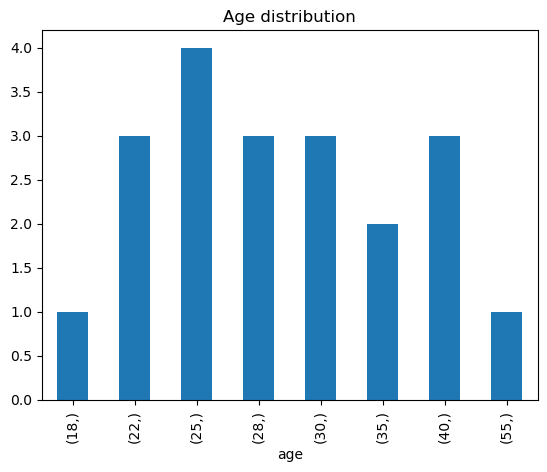

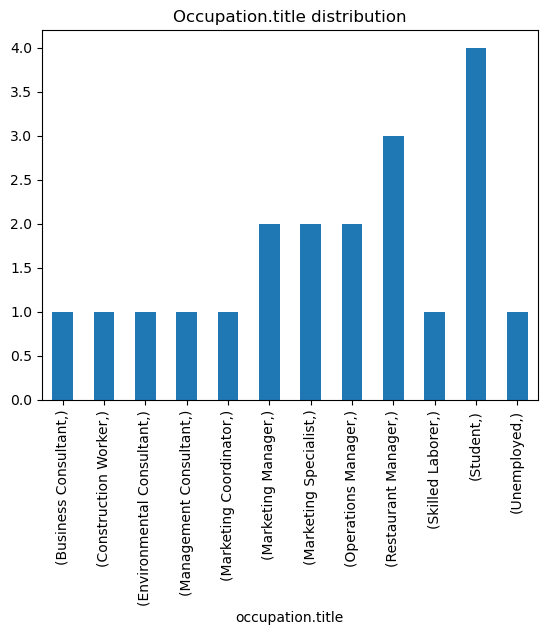

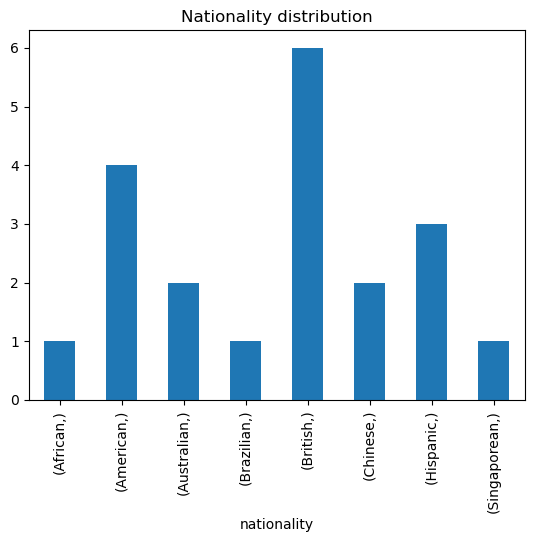

{'age': age
 18     1
 22     3
 25     4
 28     3
 30     3
 35     2
 40     3
 55     1
 Name: count, dtype: int64,
 'occupation.title': occupation.title        
 Business Consultant         1
 Construction Worker         1
 Environmental Consultant    1
 Management Consultant       1
 Marketing Coordinator       1
 Marketing Manager           2
 Marketing Specialist        2
 Operations Manager          2
 Restaurant Manager          3
 Skilled Laborer             1
 Student                     4
 Unemployed                  1
 Name: count, dtype: int64,
 'nationality': nationality
 African        1
 American       4
 Australian     2
 Brazilian      1
 British        6
 Chinese        2
 Hispanic       3
 Singaporean    1
 Name: count, dtype: int64}

In [12]:
profiler.profile(global_general_population)

In [13]:
save_population(global_general_population, "./population/global_general/")

## Population: US general population sample

In [ ]:
usa_general_sampling_space_description = describe_population_sampling_space("American", "./information/populations/usa.json")


    A uniform random representative sample of people from the American population. 
    Make sure you consider very detailed, fine-grained, characteristics of the individuals in the population.
    Please consider as many different population segments as possible, while always keeping proportions correct.
    For example, instead of sampling 10 people from segment A and 5 from segment B, you can instead
    sample 2 from A, 1 from B, and 7 others from other segments, provided the proportions are maintained correct.
    Besides anything you know about this population, also consider the following information 
    to sample proportionally to the presence of such groups and characteristics in the population.
    
              
    {
    "title": "USA Population Information",
    "description": "A detailed overview of the population demographics, traits, and habits of the United States of America.",
    "source": "Synthesized from a chat with GPT-4o",
    "content": {
        "Demographic

Summon the population out of thin simulated air. To do so, we build a factory whose context defines the sampling space. Actual agents will be later sampled from this factory.

In [ ]:
us_general_population_factory = TinyPersonFactory(sampling_space_description=usa_general_sampling_space_description, total_population_size=total_population_size)


In [7]:
us_general_population_factory.initialize_sampling_plan()
us_general_population_factory.sampling_plan

[{'sampled_values': {'age': 25,
   'gender': 'Female',
   'race': 'White (Non-Hispanic)',
   'educational attainment': "Bachelor's Degree or Higher",
   'household income': 75000,
   'geographic distribution': 'Urban',
   'marital status': 'Married',
   'employment status': 'Employed',
   'political affiliation': 'Democrat',
   'religion': 'Christian',
   'interests and hobbies': 'Traveling'},
  'quantity': 5},
 {'sampled_values': {'age': 30,
   'gender': 'Male',
   'race': 'Black or African American',
   'educational attainment': 'High School Graduate or Higher',
   'household income': 50000,
   'geographic distribution': 'Urban',
   'marital status': 'Never Married',
   'employment status': 'Employed',
   'political affiliation': 'Independent',
   'religion': 'Non-Christian',
   'interests and hobbies': 'Video Gaming'},
  'quantity': 4},
 {'sampled_values': {'age': 45,
   'gender': 'Female',
   'race': 'Hispanic or Latino',
   'educational attainment': "Bachelor's Degree or Higher",


We can request a specific number of people.

In [8]:
us_general_population = us_general_population_factory.generate_people(population_size, 
                                                                      post_processing_func=post_process_agent,
                                                                      verbose=True)

Generated person 3/20: Sarah Brown is a 30 year old Marketing Associate, American, currently living in Chicago, Illinois. Sarah Brown is not only dedicated to her role at Tech Innovations Inc., but she also possesses a friendly and approachable demeanor that makes her well-liked among colleagues. Despite her introverted nature, she finds joy in small gatherings and values deep connections with friends and family. In her free time, Sarah enjoys unwinding with video games, exploring new restaurants, and immersing herself in science fiction novels, which reflect her imaginative side. While she sometimes struggles with anxiety and indecision, she actively seeks personal growth through journaling and volunteering, demonstrating her commitment to both her community and her own well-being.
Generated person 7/20: Olivia Bennett is a 25 year old Marketing Specialist, American, currently living in Chicago, Illinois. Olivia is an optimistic and creative individual who thrives in social settings, 

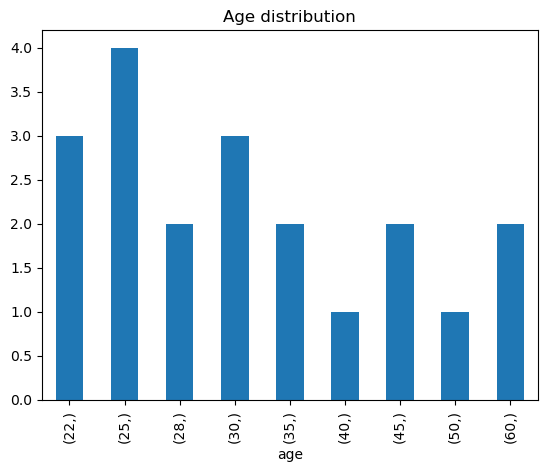

IndexError: index 0 is out of bounds for axis 0 with size 0

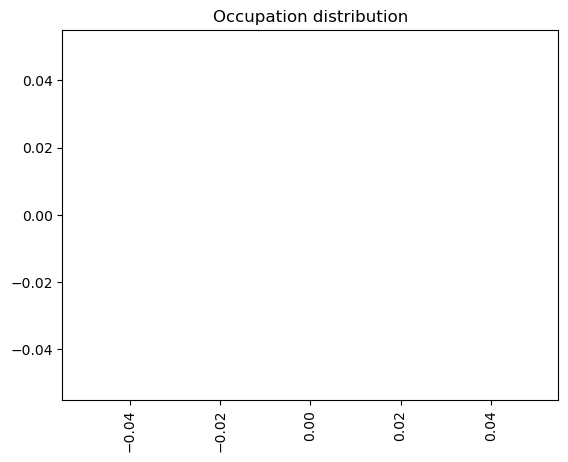

In [ ]:
profiler.profile(us_general_population)

In [9]:
save_population(us_general_population, "./population/usa_general/")

In [ ]:
TinyPerson.all_agents_names()

In [ ]:
len(TinyPerson.all_agents_names())

In [ ]:
print(list(TinyPerson.all_agents.values())[0].generate_agent_system_prompt())

## Population: US picky and negative population sample

In [8]:
usa_picky_sampling_space_description = describe_population_sampling_space("American", "./information/populations/usa.json")


        A uniform random representative sample of people from the American population. 
        Make sure you consider very detailed, fine-grained, characteristics of the individuals in the population.
        Please consider as many different population segments as possible, while always keeping proportions correct.
        For example, instead of sampling 10 people from segment A and 5 from segment B, you can instead
        sample 2 from A, 1 from B, and 7 others from other segments, provided the proportions are maintained correct.
        
            Besides anything you know about this population, also consider the following information 
            to sample proportionally to the presence of such groups and characteristics in the population.        
            
            {
    "title": "USA Population Information",
    "description": "A detailed overview of the population demographics, traits, and habits of the United States of America.",
    "source": "Synthesized from a ch

Summon the population out of thin simulated air. To do so, we build a factory whose context defines the sampling space. Actual agents will be later sampled from this factory.

In [9]:
us_picky_population_factory = TinyPersonFactory(sampling_space_description=usa_picky_sampling_space_description, total_population_size=total_population_size)


In [10]:
us_picky_population_factory.initialize_sampling_plan()
us_picky_population_factory.sampling_plan

[{'sampled_values': {'age': 25,
   'gender': 'Female',
   'race': 'White (Non-Hispanic)',
   'educational attainment': "Bachelor's Degree or Higher",
   'household income': 75000,
   'geographic distribution': 'Urban',
   'marital status': 'Married',
   'employment status': 'Employed',
   'political affiliation': 'Democrat',
   'religion': 'Christian',
   'interests and hobbies': 'Traveling'},
  'quantity': 5},
 {'sampled_values': {'age': 30,
   'gender': 'Male',
   'race': 'Black or African American',
   'educational attainment': 'High School Graduate or Higher',
   'household income': 50000,
   'geographic distribution': 'Urban',
   'marital status': 'Never Married',
   'employment status': 'Employed',
   'political affiliation': 'Independent',
   'religion': 'Non-Christian',
   'interests and hobbies': 'Video Gaming'},
  'quantity': 4},
 {'sampled_values': {'age': 45,
   'gender': 'Female',
   'race': 'Hispanic or Latino',
   'educational attainment': "Bachelor's Degree or Higher",


We can request a specific number of people.

In [11]:
us_picky_population = us_picky_population_factory.generate_people(population_size,
                                                                  agent_particularities="A very negative person, doesn't like anything. Very critical and picky, but never helpful. A rude, unfriendly, person. Rather evil too.", 
                                                                      post_processing_func=post_process_agent,
                                                                      verbose=True)

Generated person 5/20: Benjamin Young is a 19 year old Unemployed, American, currently living in Los Angeles, California. Benjamin Young's personality is marked by a strong tendency towards negativity and criticism, often leading her to isolate herself from others. Despite her keen eye for detail, which she uses primarily to critique rather than create, she possesses a hidden talent for arts and crafts that she rarely showcases due to her fear of judgment. Her interests lean towards dark humor and reality TV, where she finds solace in mocking others rather than engaging in constructive activities. Although she struggles with feelings of worthlessness and a pessimistic outlook, she harbors long-term goals of finding a fulfilling job and learning to appreciate art, indicating a flicker of hope beneath her dismissive exterior.
Generated person 12/20: Emily Johnson is a 60 year old Retired, American, currently living in Rural Ohio, USA. Emily Johnson's personality is marked by a deep-seate

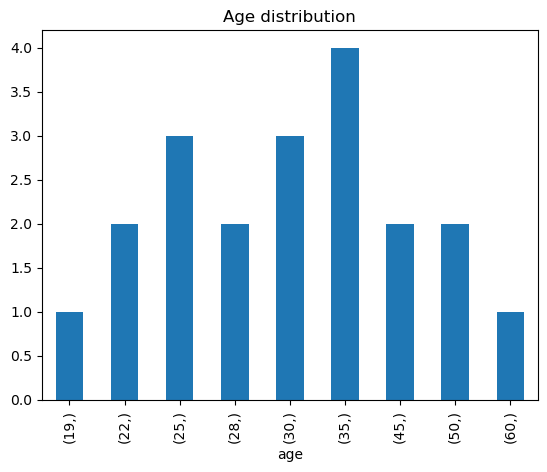

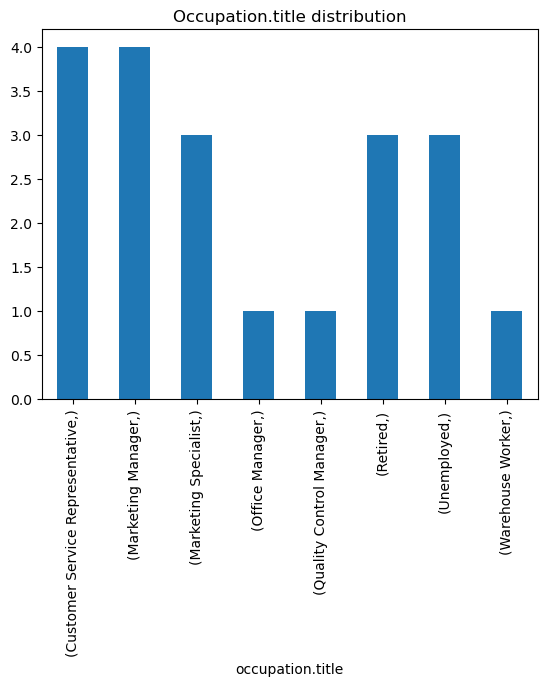

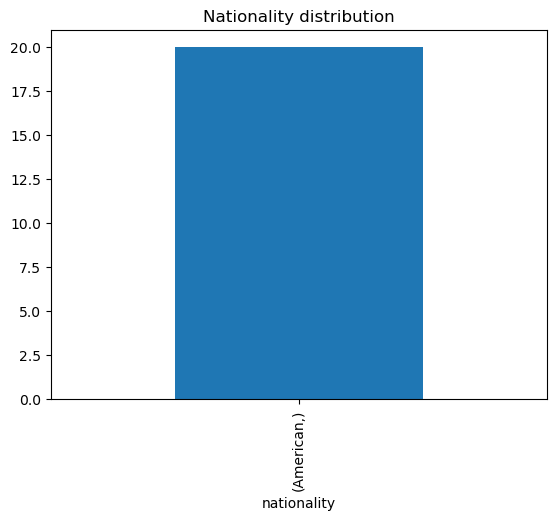

{'age': age
 19     1
 22     2
 25     3
 28     2
 30     3
 35     4
 45     2
 50     2
 60     1
 Name: count, dtype: int64,
 'occupation.title': occupation.title               
 Customer Service Representative    4
 Marketing Manager                  4
 Marketing Specialist               3
 Office Manager                     1
 Quality Control Manager            1
 Retired                            3
 Unemployed                         3
 Warehouse Worker                   1
 Name: count, dtype: int64,
 'nationality': nationality
 American       20
 Name: count, dtype: int64}

In [12]:
profiler.profile(us_picky_population)

In [13]:
save_population(us_picky_population, "./population/usa_picky/")

## Populations: US general population sliced by singles, families (children), and couples(no children)

In [8]:
usa_general_sampling_space_description = describe_population_sampling_space("American", "./information/populations/usa.json")


        A uniform random representative sample of people from the American population. 
        Make sure you consider very detailed, fine-grained, characteristics of the individuals in the population.
        Please consider as many different population segments as possible, while always keeping proportions correct.
        For example, instead of sampling 10 people from segment A and 5 from segment B, you can instead
        sample 2 from A, 1 from B, and 7 others from other segments, provided the proportions are maintained correct.
        
            Besides anything you know about this population, also consider the following information 
            to sample proportionally to the presence of such groups and characteristics in the population.        
            
            {
    "title": "USA Population Information",
    "description": "A detailed overview of the population demographics, traits, and habits of the United States of America.",
    "source": "Synthesized from a ch

In [9]:
us_singles_factory = TinyPersonFactory(sampling_space_description=usa_general_sampling_space_description, total_population_size=large_total_population_size)
us_families_factory = TinyPersonFactory(sampling_space_description=usa_general_sampling_space_description, total_population_size=large_total_population_size)
us_couples_factory = TinyPersonFactory(sampling_space_description=usa_general_sampling_space_description, total_population_size=large_total_population_size)

In [10]:
us_singles = us_singles_factory.generate_people(large_population_size, 
                                               agent_particularities="Must be single and have no children.", 
                                               post_processing_func=lambda x: post_process_agent(x, group="singles"),
                                               verbose=True)

2025-04-17 19:16:46,342 - tinytroupe - DEBUG - -----------------------------------------> Transaction: _generate_people_in_parallel with args () and kwargs {'number_of_people': 40, 'agent_particularities': 'Must be single and have no children.', 'temperature': 1.7, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'attempts': 10, 'post_processing_func': <function <lambda> at 0x000001BA545B3010>, 'verbose': True} under simulation None, parallel=True.
2025-04-17 19:16:46,345 - tinytroupe - INFO - Starting the person generation based on that context: None
2025-04-17 19:16:46,350 - tinytroupe - INFO - Starting the person generation based on that context: None
2025-04-17 19:16:46,351 - tinytroupe - DEBUG - -----------------------------------------> Transaction: _initialize_sampling_plan_transaction with args () and kwargs {'n': 60, 'description': '\n        A uniform random representative sample of people from the American population. \n        Make sure you consider very detailed, fine-gr

Generated person 8/40: Liam Johnson is a 22 year old Unemployed, American, currently living in Rural Midwest, USA. Liam is a friendly and approachable individual who thrives in the company of his close-knit group of friends, often finding solace in their shared love for sports. Despite his struggles with anxiety, he uses humor as a coping mechanism, which helps him navigate social situations more comfortably. His passion for basketball and football not only fuels his interest in sports but also drives his long-term goal of pursuing a degree in sports management. Liam enjoys engaging in outdoor activities like hiking and fishing, and he finds joy in the simple pleasures of life, such as barbecuing on weekends and playing video games with friends.


2025-04-17 19:18:25,570 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:18:25,580 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4121.
2025-04-17 19:18:25,581 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:18:25,583 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:18:25,659 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:18:25,664 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1345.
2025-04-17 19:18:25,666 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 1/40: Julian Grant is a 25 year old Mental Health Advocate, American, currently living in Boston, Massachusetts. Julian Grant is a warm and approachable individual, known for her quirky sense of humor that helps her navigate the emotional challenges of her work. She has a deep empathy for others, often engaging in meaningful conversations that foster connections. In her free time, Julian enjoys quiet evenings with a good book, practicing yoga, and exploring new cafes around Boston. Her commitment to mental health advocacy is complemented by her strong communication skills and a belief that open conversations can significantly reduce stigma surrounding mental health issues.


2025-04-17 19:18:28,783 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:18:28,795 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4129.
2025-04-17 19:18:28,796 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:18:28,812 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:18:31,270 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'

Generated person 5/40: Oliver Brooks is a 35 year old Baker, American, currently living in Atlanta, Georgia. Oliver is not only a talented baker but also a creative soul who thrives on experimenting with flavors and techniques. His nurturing personality shines through in his interactions with customers, as he genuinely enjoys hearing their stories and sharing his own cultural heritage through food. Despite the challenges of long hours in the bakery, he finds solace in cooking and often volunteers at local food banks, reflecting his belief that everyone deserves access to healthy meals. In his free time, Oliver loves visiting farmers' markets to source fresh ingredients and often hosts potlucks with friends, where he can showcase his latest culinary creations.


2025-04-17 19:18:40,963 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:18:40,968 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:18:40,973 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1194.
2025-04-17 19:18:40,974 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4129.
2025-04-17 19:18:40,975 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:18:40,978 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:18:40,974 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 13/40: Amelia Foster is a 30 year old Unemployed, American, currently living in Los Angeles, California. Amelia is an outgoing individual who thrives in social settings, often finding joy in meeting new people and engaging in community events. With a creative mind, she enjoys exploring her artistic side through digital art and video gaming, using these interests as a means to connect with friends and express herself. Although she can be indecisive and sensitive to criticism, she actively seeks to build a supportive community around her, valuing empathy and connection. Amelia is also passionate about social activism, particularly in mental health awareness, and enjoys cooking, often experimenting with vegetarian and vegan recipes.


2025-04-17 19:18:54,262 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:18:54,266 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1136.
2025-04-17 19:18:54,267 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:18:54,268 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:19:02,330 - tinytroupe - WARNING - [1] Rate limit error, waiting a bit and trying again.
2025-04-17 19:19:02,331 - tinytroupe - INFO - Request failed. Waiting 2 seconds between requests...
2025-04-17 19:19:02,724 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNRrSjfKmlHq5lXLxMgyG0d3tmVG7', choices=[Choice(finish_reason='stop', index

Generated person 10/40: Evelyn Brooks is a 22 year old Unemployed, American, currently living in Rural Midwest, USA. Evelyn is a friendly individual who thrives in the world of sports, often finding solace in basketball and football. Despite his anxiety in social situations, he opens up when discussing his favorite teams or strategies, showcasing his deep understanding of sports statistics. He enjoys spending time with his close-knit group of friends, particularly during game nights, where he feels most at ease. Although he faces challenges due to his lack of formal education, Evelyn remains determined to improve his situation and believes in the power of community and second chances.


2025-04-17 19:19:03,458 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:19:03,460 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1247.
2025-04-17 19:19:03,461 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:19:03,464 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:19:04,333 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:19:04,351 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4129.
2025-04-17 19:19:04,355 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:19:04,357 - tinytroupe - INFO - Waiting 10.

Generated person 6/40: Grace Nguyen is a 28 year old Craft Artist, American, currently living in Atlanta, Georgia. Grace Nguyen is not only a talented craft artist but also a vibrant personality who thrives on creativity and connection. Her outgoing nature makes her a favorite at local craft fairs, where she enjoys engaging with customers and fellow artists alike. With a passion for DIY projects and a love for bright colors, she often experiments with new materials, drawing inspiration from nature and her multicultural upbringing. Despite facing challenges in managing her business, Grace remains optimistic and dedicated to building a supportive community of artists, all while dreaming of one day opening her own art studio.


2025-04-17 19:19:13,882 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:19:13,884 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1235.
2025-04-17 19:19:13,885 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:19:13,886 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:19:14,359 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:19:16,134 -

Generated person 9/40: Nathaniel Scott is a 40 year old Construction Worker, American, currently living in Rural Alabama, USA. Nathaniel Scott is a dedicated and hardworking individual who takes great pride in his craftsmanship as a construction worker. He enjoys the physicality of his job, often finding solace in outdoor activities like fishing and hiking, which allow him to unwind after long hours on the job. With a strong sense of responsibility, he values honesty and straightforwardness in his interactions, often using humor to connect with his coworkers. In his free time, Nathaniel indulges in DIY home improvement projects and has a passion for woodworking, creating furniture that reflects his skills and creativity.


2025-04-17 19:19:17,920 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:19:17,931 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4129.
2025-04-17 19:19:17,932 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:19:17,934 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:19:18,121 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:19:18,139 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4125.
2025-04-17 19:19:18,141 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 14/40: Henry Adams is a 25 year old Mental Health Advocate, American, currently living in Boston, Massachusetts. Henry Adams is not only dedicated to mental health advocacy but also embodies a warm and approachable personality that makes him relatable to those he seeks to help. His empathetic nature drives him to engage deeply with others, often using humor to lighten heavy conversations. Outside of his advocacy work, Henry enjoys reading self-help literature and practicing yoga, which helps him manage the emotional weight of his experiences. He values community support and believes in the importance of open discussions about mental health, often volunteering at local shelters and participating in group discussions to foster understanding and connection.


2025-04-17 19:19:25,404 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:19:25,411 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4126.
2025-04-17 19:19:25,412 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:19:25,413 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:19:27,990 - tinytroupe - WARNING - [1] Rate limit error, waiting a bit and trying again.
2025-04-17 19:19:27,992 - tinytroupe - INFO - Request failed. Waiting 2 seconds between requests...
2025-04-17 19:19:28,010 - tinytroupe - WARNING - [1] Rate limit error, waiting a bit and trying again.
2025-04

Generated person 16/40: Olivia Walker is a 55 year old Retired, American, currently living in Boston, Massachusetts. Olivia Walker embodies a calm and reflective demeanor, often engaging in deep conversations that foster meaningful connections. Her love for travel is not just about exploring new places; it’s a way for her to honor the memory of her late husband, David, by visiting locations that held significance for them both. With a strong commitment to mental health advocacy, she actively volunteers and participates in community service, believing that everyone deserves compassion and understanding. In her quiet moments, she finds joy in nurturing her small garden, where she grows herbs and vegetables, reflecting her appreciation for nature and healthy living.


2025-04-17 19:19:34,311 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:19:34,320 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4126.
2025-04-17 19:19:34,322 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:19:34,344 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:19:34,959 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRrs07d5qbtg0NDzZR28ablOjbvr', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Ava Martinez",\n  

Generated person 20/40: Ava Martinez is a 35 year old Culinary Assistant, American, currently living in Atlanta, Georgia. Ava is not only passionate about cooking but also deeply values the connections that food can create among people. Her nurturing personality shines through in her love for hosting dinner parties, where she enjoys sharing her culinary creations with friends and family. She is particularly interested in exploring indigenous cultures, which reflects her commitment to preserving culinary traditions and promoting sustainability in food practices. Despite the challenges of her fast-paced job, Ava finds joy in experimenting with new recipes and is always eager to learn more about healthy eating and nutrition, making her a well-rounded culinary enthusiast.


2025-04-17 19:19:40,053 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:19:40,057 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:19:40,801 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:19:40,807 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4125.
2025-04-17 19:19:40,809 - tinytroupe - DEBUG - Calling model with clien

Generated person 21/40: Lily Foster is a 35 year old Baker, American, currently living in Atlanta, Georgia. Lily is a creative spirit who finds joy in experimenting with new recipes, often drawing inspiration from her childhood experiences in her grandmother's kitchen. Her nurturing nature shines through as she frequently helps friends and family with their cooking, fostering a sense of community around shared meals. Despite her occasional anxiety about the future, she channels her feelings into her baking, viewing it as both a therapeutic outlet and a form of self-expression. With a passion for healthy, organic ingredients, she actively seeks out fresh produce at local farmers' markets, reflecting her commitment to nourishing both herself and those around her.


2025-04-17 19:19:55,711 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:19:55,715 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1239.
2025-04-17 19:19:55,715 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:19:55,717 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:20:02,882 - tinytroupe - WARNING - [2] Rate limit error, waiting a bit and trying again.
2025-04-17 19:20:02,883 - tinytroupe - INFO - Request failed. Waiting 10.0 seconds between requests...
2025-04-17 19:20:03,246 - tinytroupe - WARNING - [2] Rate limit error, waiting a bit and trying again.
2025-04-17 19:20:03,247 - tinytroupe - INFO - Request failed. Waiti

Generated person 19/40: Samantha Reed is a 30 year old Unemployed, American, currently living in Los Angeles, California. Samantha Reed is a friendly and approachable individual who thrives in one-on-one interactions, often finding solace in cozy cafes and nature walks. With a creative mind, they enjoy exploring graphic design and digital art, although self-doubt sometimes hinders their progress. Passionate about social issues, Samantha actively engages in discussions about climate change and social justice, believing that art can inspire change. Despite experiencing anxiety, they practice mindfulness and find joy in video gaming, which serves as both a form of relaxation and a means of storytelling.


2025-04-17 19:20:07,143 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:20:07,148 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1234.
2025-04-17 19:20:07,149 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:20:07,150 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:20:07,198 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:20:07,239 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4126.
2025-04-17 19:20:07,241 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:20:07,242 - tinytroupe - INFO - Calling LLM

Generated person 22/40: Henry Mitchell is a 40 year old Construction Worker, American, currently living in Rural Alabama, USA. Henry Mitchell is not only dedicated to his work but also possesses a strong sense of community, often volunteering for local clean-up events and helping neighbors with home repairs. He enjoys the outdoors, frequently spending weekends fishing or hiking with friends, which allows him to recharge after long hours on the job. With a pragmatic and straightforward communication style, he values honesty and often uses humor to connect with others, though he can be blunt at times. His long-term aspirations reflect his commitment to sustainable practices in construction, as well as a desire to contribute positively to his community and family life.


2025-04-17 19:20:17,437 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:20:17,448 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4121.
2025-04-17 19:20:17,449 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:20:17,451 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:20:17,789 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:20:17,799 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4125.
2025-04-17 19:20:17,800 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 24/40: Lily Carter is a 60 year old Marketing Manager, American, currently living in Boston, Massachusetts. Lily Carter is known for her friendly and approachable demeanor, often using humor to connect with colleagues and clients alike. She thrives in social settings, enjoying networking events and community service, which reflect her strong sense of responsibility and commitment to giving back. An avid reader, she has a personal library filled with business and self-help books, and she often engages in discussions about current events and social issues. With a passion for travel, she looks forward to exploring new cultures and maintaining an active lifestyle in her retirement.


2025-04-17 19:20:29,565 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:20:29,570 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4129.
2025-04-17 19:20:29,572 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:20:29,573 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:20:35,698 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRsnY079cR00HmZz2kgcDUjHK2y7', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Charlotte Evans",\

Generated person 23/40: Charlotte Evans is a 55 year old Retired, American, currently living in Boston, Massachusetts. Charlotte's empathetic nature and calm demeanor make her a cherished friend and confidante. She finds joy in quiet mornings, often sipping tea while journaling her thoughts and reflections. With a deep appreciation for art and culture, she frequently visits galleries and enjoys engaging in meaningful conversations about spirituality and personal growth. Her commitment to mindfulness and community service not only enriches her own life but also inspires those around her to embrace compassion and intentional living.


2025-04-17 19:20:38,663 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:20:38,671 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4126.
2025-04-17 19:20:38,673 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:20:38,674 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:20:39,126 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRsjVk83FXZfI2o7t45vUG2OULq2', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Daniel Foster",\n 

Generated person 25/40: Daniel Foster is a 30 year old Unemployed, American, currently living in Los Angeles, California. Daniel is an outgoing and creative individual who thrives in social settings, often using humor to connect with others. Despite facing challenges with anxiety and self-doubt, he channels his emotions into his art, finding inspiration in everyday life and personal experiences. He enjoys engaging with online communities related to gaming and art, and values the importance of mental health and community connection. With a passion for digital design and a desire to return to school, Daniel is determined to find a stable job that allows for creative expression while building a supportive network of friends and fellow creatives.


2025-04-17 19:20:45,288 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRsxZiCkQKCm9NXnnIb9lz08GkcH', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Luna Hayes",\n    "age": 25,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Boston, Massachusetts",\n    "education": "Boston University, Bachelor\'s in English Literature. Focused on contemporary fiction and its impact on society. Completed an internship at a local publishing house.",\n    "long_term_goals": [\n        "To become a published author and share stories that resonate with readers.",\n        "To advocate for mental health awareness through writing.",\n        "To travel extensively and experience diverse cultures.",\n        "To build a supportive community of fellow writers and creatives."\n    ],\n    "occupation": {\n        "title": "Content Writer",

Generated person 15/40: Noah Lewis is a 25 year old Content Writer, American, currently living in Boston, Massachusetts. Noah is a warm and approachable individual, known for her strong sense of empathy and curiosity about the world. She enjoys engaging in thoughtful discussions, often using humor to connect with others. In her free time, she finds joy in exploring local coffee shops and bookstores, as well as attending literary events and workshops that fuel her passion for storytelling. Despite her occasional struggles with anxiety, she actively practices yoga and mindfulness, which help her maintain a balanced perspective while pursuing her long-term goals of becoming a published author and advocating for mental health awareness.


2025-04-17 19:20:49,222 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRt2rLERv5oCWKgqO3D4kn0SvfoF', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Michael Thompson",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Atlanta, Georgia",\n    "education": "Georgia State University, Some College. Studied Fine Arts with a focus on painting and sculpture, but did not complete the degree due to financial constraints.",\n    "long_term_goals": [\n        "To establish a successful career in the arts, particularly in community-based projects.",\n        "To create a sustainable art studio that provides workshops for underprivileged youth.",\n        "To travel and experience different cultures, using art as a means of connection."\n    ],\n    "occupation": {\n        "title": "Art Instructor",\n        "org

Generated person 26/40: Luna Hayes is a 25 year old Content Writer, American, currently living in Boston, Massachusetts. Luna Hayes is a warm and approachable individual, known for her strong sense of empathy and curiosity about the world. She enjoys engaging in thoughtful discussions and often uses humor to connect with others, making her a beloved member of her writing community. In her free time, Luna finds joy in exploring local coffee shops and bookstores, where she often seeks inspiration for her writing. With a passion for mental health advocacy, she believes in the power of storytelling to drive social change and is dedicated to building a supportive network of fellow writers and creatives.


2025-04-17 19:20:57,751 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:20:57,754 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:20:57,759 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1303.
2025-04-17 19:20:57,761 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:20:57,763 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:20:57,764 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4130.
2025-04-17 19:20:57,845 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:20:57,846 - tinytroupe - INFO - Calling LLM

Generated person 27/40: Michael Thompson is a 28 year old Art Instructor, American, currently living in Atlanta, Georgia. Michael Thompson is not only dedicated to his role as an art instructor but also embodies a warm and approachable personality that resonates with his students. His nurturing nature drives him to go above and beyond to support those he teaches, often engaging with them outside of class to foster their artistic growth. Michael has a strong passion for community service and environmental activism, frequently volunteering for local initiatives and organizing workshops that promote creativity among underprivileged youth. Despite his occasional struggles with self-doubt and financial stress, he remains optimistic about the transformative power of art and dreams of establishing a sustainable art studio that serves as a creative hub for his community.


2025-04-17 19:21:06,893 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:21:06,904 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4125.
2025-04-17 19:21:06,930 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:21:06,931 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:21:07,279 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:21:07,291 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4121.
2025-04-17 19:21:07,291 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 17/40: Ethan Kim is a 50 year old Retired, American, currently living in Rural Midwest, USA. Ethan Kim is a compassionate individual who finds great joy in caring for animals, often spending his days volunteering at local shelters and nurturing his own pets. He has a deep appreciation for nature, frequently taking long walks to observe wildlife and clear his mind. Although he tends to be reserved, he possesses a dry sense of humor that emerges in the company of close friends, particularly when discussing topics related to animal welfare. With a strong work ethic and a love for gardening, Ethan enjoys the simple pleasures of life, such as cooking hearty meals and reflecting on his experiences, all while maintaining a balanced and active lifestyle.


2025-04-17 19:21:26,970 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:21:27,428 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:21:27,440 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4125.
2025-04-17 19:21:27,441 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:21:27,443 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'

Generated person 31/40: Amelia Torres is a 40 year old Construction Worker, American, currently living in Rural South, USA. Amelia Torres is a dedicated and hardworking individual who takes great pride in her craftsmanship. With a practical and straightforward communication style, she values honesty and integrity, both in her work and personal life. Outside of her construction job, Amelia enjoys outdoor activities like fishing and hiking, often spending weekends working on home improvement projects or helping neighbors. Her passion for sustainability drives her long-term goal of owning a small construction business that focuses on eco-friendly practices, and she is committed to mentoring young people in her community to share her skills and knowledge.


2025-04-17 19:21:34,324 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:21:35,213 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:21:35,223 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4126.
2025-04-17 19:21:35,225 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:21:35,227 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'

Generated person 28/40: Chloe Bennett is a 40 year old Construction Worker, American, currently living in Rural South, USA. Chloe Bennett is a dedicated and hardworking individual who takes great pride in his craftsmanship as a construction worker. He enjoys the physical nature of his job and often finds solace in outdoor activities like fishing and hiking, which allow him to unwind after a long day. With a strong sense of responsibility, Chloe values honesty and straightforwardness in his interactions, often using humor to connect with his coworkers. He dreams of owning a small construction business focused on sustainable practices and is committed to mentoring young people in his community, sharing the skills he has honed over the years.


2025-04-17 19:21:41,219 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:21:41,224 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4127.
2025-04-17 19:21:41,226 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:21:41,227 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:21:46,077 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRttTsroNXfrKLwOVx8ie0lsXYN6', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Scarlett Nguyen",\

Generated person 32/40: Scarlett Nguyen is a 50 year old Retired, American, currently living in Rural Midwest, USA. Scarlett Nguyen is a deeply reflective individual who finds solace in the quiet moments of life. With a strong affinity for animals, he dedicates time to caring for his pets and volunteering at the local animal shelter, which brings him a sense of purpose. His love for gardening not only provides him with fresh produce but also serves as a therapeutic outlet, allowing him to connect with nature. Despite his reserved nature, he values the importance of community and cherishes the friendships he has cultivated, particularly with his neighbor Linda, who shares his passion for gardening.


2025-04-17 19:21:57,374 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:21:57,376 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1225.
2025-04-17 19:21:57,376 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:21:57,377 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:21:58,631 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRu8KJyz6tyWZsTiLRV8YxfanoNy', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Isabella Garcia",\n    "age": 60,\n    "gender": "Male",\n    "nationality": "Ame

Generated person 30/40: Isaac Johnson is a 30 year old Unemployed, American, currently living in Los Angeles, California. Isaac is a friendly and introspective individual who thrives in creative environments, often finding solace in digital art and design. They have a strong passion for social justice and environmental activism, which influences their artistic expression and community involvement. While they enjoy socializing, Isaac also values their alone time, using it to recharge and reflect. Their ability to communicate effectively, especially in one-on-one settings, allows them to build meaningful connections, particularly with friends who share their interests in art and gaming.


2025-04-17 19:22:05,820 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:22:05,823 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1267.
2025-04-17 19:22:05,824 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:22:05,825 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:22:11,747 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:22:11,761 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4129.
2025-04-17 19:22:11,762 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:22:11,764 - tinytroupe - INFO - Waiting 250

Generated person 29/40: Jaxon Rivera is a 25 year old Public Relations Specialist, American, currently living in Boston, Massachusetts. Jaxon Rivera is not only dedicated to her role as a Public Relations Specialist but also embodies a vibrant and engaging personality. With a strong sense of empathy and justice, she actively participates in community service and advocates for healthcare affordability, reflecting her belief that healthcare is a fundamental right. Jaxon enjoys exploring new cuisines and cultures, often seeking out cozy coffee shops and outdoor activities to unwind. Her friendly demeanor and storytelling ability make her a natural at connecting with others, whether in professional settings or during her volunteer work.


2025-04-17 19:22:17,790 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:22:17,798 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4130.
2025-04-17 19:22:17,799 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:22:17,800 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:22:17,975 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:22:17,986 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4125.
2025-04-17 19:22:17,988 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 34/40: Isabella Garcia is a 60 year old Project Manager, American, currently living in Boston, Massachusetts. Isabella Garcia is not only a dedicated project manager but also a vibrant individual with a passion for life. She enjoys cooking and often experiments with new recipes inspired by her travels, reflecting her love for exploring different cultures. Isabella is an active member of a local book club, where she shares her enthusiasm for historical fiction and engages in lively discussions. With a strong sense of community, she frequently volunteers for service projects and values the importance of lifelong learning, believing it essential for personal growth.


2025-04-17 19:22:21,728 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:22:21,737 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4129.
2025-04-17 19:22:21,739 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:22:21,740 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:22:25,963 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:22:25,974 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4126.
2025-04-17 19:22:25,975 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 35/40: Madison Reed is a 45 year old Unemployed, American, currently living in Hilo, Hawaii. Madison Reed is a conscientious individual who takes her responsibilities seriously, often reflecting on her goals and feelings through journaling. While she tends to be reserved in social situations, she finds joy in community events and local culture, often volunteering when she feels up to it. Her passion for fashion allows her to express herself creatively, and she enjoys thrift shopping for unique finds. Despite facing challenges in her job search, Madison remains hopeful about finding a stable position that aligns with her values and contributes to her community.


2025-04-17 19:22:35,290 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:22:35,299 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4126.
2025-04-17 19:22:35,302 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:22:35,304 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:22:40,822 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'

Generated person 39/40: Sophia Patel is a 60 year old Marketing Manager, American, currently living in Boston, Massachusetts. Sophia Patel is known for her optimistic outlook and sociable nature, which makes her a beloved figure among colleagues and friends alike. She thrives in social settings, often using her strong communication skills and sense of humor to foster a positive atmosphere. Outside of work, Sophia enjoys exploring historical sites and attending cultural events, reflecting her passion for learning and community involvement. With a commitment to lifelong learning, she actively mentors young professionals, sharing her extensive knowledge in marketing while also finding joy in cooking and hosting gatherings for her loved ones.


2025-04-17 19:22:48,563 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:22:48,573 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4125.
2025-04-17 19:22:48,577 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:22:48,579 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:22:50,327 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRv0rGgNTpfFRdjJFI4vcJ8kKNQO', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Chloe Martinez",\n

Generated person 36/40: Chloe Martinez is a 22 year old Unemployed, American, currently living in Rural Midwest, USA. Chloe is a sensitive and empathetic individual who often uses humor to navigate the challenges of life. Despite feeling anxious in social situations, she thrives when surrounded by her close-knit group of friends, particularly during basketball games or while playing video games. Her passion for sports not only serves as a source of joy but also as a way to connect with others, as she believes in the unifying power of athletics. Although she struggles with feelings of inadequacy and procrastination, Chloe is determined to find stable employment and eventually return to school, motivated by her long-term goals of personal growth and community building.


2025-04-17 19:22:54,991 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:22:54,996 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1227.
2025-04-17 19:22:54,997 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:22:54,998 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:22:57,006 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNRvFOjao4NY9IEJZC3n3pObZcwHc', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Lucas is a dedicated and hardworking individual who takes great pride in his craftsmanship. He enjoys spending his free time outdoors, often fish

Generated person 37/40: Lucas Ramirez is a 40 year old Construction Worker, American, currently living in Rural Alabama, USA. Lucas is a dedicated and hardworking individual who takes great pride in his craftsmanship. He enjoys spending his free time outdoors, often fishing or hiking with friends, and finds solace in woodworking projects at home. With a strong sense of community, he frequently volunteers for local clean-up events and helps neighbors with home repairs. Although he can be blunt at times, his practical humor and straightforward communication style endear him to those around him, making him a valued friend and colleague.


2025-04-17 19:22:58,842 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRv85RLPBTEu7S4B0lcdaYp1vWtW', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Isaiah Patel",\n    "age": 55,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Boston, Massachusetts",\n    "education": "Boston University, Bachelor\'s in Business Administration. Focused on Marketing and Consumer Behavior. Completed various workshops on digital marketing and social media strategies.",\n    "long_term_goals": [\n        "To travel extensively and experience different cultures around the world.",\n        "To find a sense of community and belonging in a new environment.",\n        "To engage in volunteer work that supports underprivileged communities."\n    ],\n    "occupation": {\n        "title": "Retired Marketing Specialist",\n        "organization

Generated person 40/40: Isaiah Patel is a 55 year old Retired Marketing Specialist, American, currently living in Boston, Massachusetts. Isaiah Patel is a warm and approachable individual who thrives on deep conversations and meaningful connections. With a strong passion for travel, she has explored over 20 countries and aims to immerse herself in at least 10 more, believing that travel enriches the soul. In her free time, she enjoys cooking, often experimenting with new recipes while listening to classical and world music. Isaiah is also dedicated to community involvement, volunteering at local shelters and participating in book clubs, reflecting her belief in kindness and lifelong learning.


2025-04-17 19:23:11,570 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRumE8LFwng72IyfTHKV2qsp1JI0', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Samantha Lee",\n    "age": 25,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Boston, Massachusetts",\n    "education": "Boston University, Bachelor\'s in Psychology. Focused on mental health and community support. Completed an internship at a local mental health clinic.",\n    "long_term_goals": [\n        "To become a licensed psychologist and help individuals navigate their mental health challenges.",\n        "To advocate for mental health awareness and accessibility in underserved communities.",\n        "To travel extensively and experience different cultures.",\n        "To build a fulfilling life centered around personal growth and meaningful relationships."\n

Generated person 38/40: Samantha Lee is a 25 year old Mental Health Advocate, American, currently living in Boston, Massachusetts. Samantha is known for her warm and approachable demeanor, often using her quirky sense of humor to connect with others and lighten the emotional load of her work. She has a deep empathy for those she helps, which sometimes leads to feeling overwhelmed by the challenges they face. In her free time, she enjoys quiet evenings with a good book, practicing yoga, and exploring local art galleries, all of which help her recharge. With a strong belief in the importance of mental health, she actively engages in community events and values meaningful conversations that foster deep connections.


2025-04-17 19:23:32,986 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRvgCfnssdRjx952iK7LbZA4prnf', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Gabriel Scott",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Atlanta, Georgia",\n    "education": "Georgia State University, Some College. Studied Fine Arts with a focus on painting and crafts, but did not complete the degree due to financial constraints.",\n    "long_term_goals": [\n        "To establish a successful small business focused on handmade crafts and DIY projects.",\n        "To travel across the country, showcasing her art at various fairs and markets.",\n        "To create a community space for local artists to collaborate and share their work."\n    ],\n    "occupation": {\n        "title": "Craft Artist",\n        "organization": "Se

Generated person 33/40: Gabriel Scott is a 28 year old Craft Artist, American, currently living in Atlanta, Georgia. Gabriel Scott is not only a talented craft artist but also a vibrant personality who thrives on social interactions. Her outgoing nature and love for community events allow her to connect deeply with fellow artists and customers alike, often using humor to break the ice. Passionate about sustainability, she incorporates eco-friendly practices into her crafting, believing that art should be both beautiful and responsible. Despite the challenges of financial instability, she remains optimistic and driven, constantly seeking new experiences and opportunities to showcase her work while supporting her local artistic community.


2025-04-17 19:25:13,351 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:25:13,366 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:25:13,616 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type'

Generated person 4/40: Charlotte Nguyen is a 30 year old Unemployed, American, currently living in Los Angeles, California. Charlotte is an outgoing and creative individual who thrives in social settings, often finding joy in meeting new people and engaging in community activities. With a strong passion for digital art and graphic design, they have honed their skills in Adobe Creative Suite, particularly Photoshop and Illustrator, despite not completing a formal degree. Charlotte enjoys spending time in cozy cafes, playing indie video games, and participating in local art events, all while using humor to navigate life's challenges. They are also committed to mental health awareness and believe in the importance of community support, often volunteering at local shelters when they feel up to it.


2025-04-17 19:25:27,397 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:25:27,400 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1228.
2025-04-17 19:25:27,401 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:25:27,402 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:25:29,334 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNRxhqSfiEdDKm1lLY0nLu9NQAWdD', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Mia Robinson is a dedicated and hardworking individual who takes great pride in his craftsmanship. He enjoys spending time outdoors, often engagi

Generated person 2/40: Mia Robinson is a 40 year old Construction Worker, American, currently living in Rural Alabama, USA. Mia Robinson is a dedicated and hardworking individual who takes great pride in his craftsmanship. He enjoys spending time outdoors, often engaging in activities like fishing and hiking with his best friend, James. Mia has a strong sense of community and frequently volunteers at local centers, teaching woodworking skills to children, reflecting his belief in the importance of family and tradition. With a passion for cooking traditional Southern dishes, he often gathers with family and friends for barbecues, where he shares stories and laughter, showcasing his friendly and cooperative nature.


2025-04-17 19:25:29,712 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:25:29,715 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1305.
2025-04-17 19:25:29,716 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:25:29,717 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:25:33,631 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNRxjCDWHXzver0LFaJpQZOtxmS5U', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Evelyn is a deeply creative individual who thrives in the world of digital art and video gaming, often using these passions as a means of self-ex

Generated person 7/40: Evelyn Martinez is a 30 year old Unemployed, American, currently living in Los Angeles, California. Evelyn is a deeply creative individual who thrives in the world of digital art and video gaming, often using these passions as a means of self-expression and connection with others. They have a strong sense of empathy, which drives their interest in social issues, particularly climate change and mental health awareness. Despite facing challenges in the job market, Evelyn remains determined to carve out a niche in the creative industry, often finding solace in cozy gaming nights with friends and engaging in online communities that share their interests. Their laid-back style and friendly, albeit sometimes sarcastic, communication help them forge meaningful connections, even as they navigate their own anxieties about the future.


2025-04-17 19:25:34,017 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:25:34,019 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1164.
2025-04-17 19:25:34,020 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:25:34,021 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:25:35,963 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRxeVCfVbTwzfNZ5BIHj92awhx4j', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Lily Nguyen",\n    "age": 35,\n    "gender": "Female",\n    "nationality": "Ameri

Generated person 12/40: James Anderson is a 25 year old Content Writer, American, currently living in Boston, Massachusetts. James Anderson is a warm and approachable individual, known for his strong sense of empathy and curiosity about the world. He enjoys deep conversations, often finding solace in quiet mornings spent journaling or brainstorming ideas for his writing. With a passion for literature, he frequently explores local coffee shops and bookstores, seeking inspiration for his stories. Despite the challenges of freelance life, he remains dedicated to advocating for mental health awareness and dreams of building a supportive community of fellow writers.


2025-04-17 19:25:36,856 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:25:36,860 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1252.
2025-04-17 19:25:36,860 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:25:36,861 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:25:39,060 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNRxqSG8UUUChuv212nLhscvpZxZn', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Lily is a warm and nurturing individual who thrives on creativity, often experimenting with new flavors and recipes during her weekends. Her pass

Generated person 11/40: Lily Nguyen is a 35 year old Baker, American, currently living in Atlanta, Georgia. Lily is a warm and nurturing individual who thrives on creativity, often experimenting with new flavors and recipes during her weekends. Her passion for cooking extends beyond the kitchen, as she enjoys exploring local farmers' markets and attending food festivals, where she can connect with her community and learn about indigenous cultures. Despite the pressures of her job, she maintains a positive outlook and has developed effective coping mechanisms for stress, often finding solace in gardening and listening to music while she bakes. With a strong belief in the importance of culinary traditions, she dreams of opening her own bakery that not only serves delicious food but also educates others about the rich heritage of Native American cuisine.


2025-04-17 19:26:21,773 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:26:27,654 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRyTQDV2e3mcpSfWRS7avCByDCRI', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Madison Torres",\n    "age": 22,\n    "gender": "Male",\n    "nationality": "American",\n    "residence": "Rural Midwest, USA",\n    "education": "High School dropout, currently pursuing a GED through online courses.",\n    "long_term_goals": [\n        "To find stable employment that allows for personal growth and independence.",\n        "To eventual

Generated person 3/40: Madison Torres is a 22 year old Unemployed, American, currently living in Rural Midwest, USA. Madison is a friendly and approachable individual, though he often grapples with anxiety that can make social interactions challenging. His passion for sports not only provides him joy but also serves as a bridge to connect with others, especially during casual games or community events. Despite his self-critical nature, he possesses a wealth of knowledge about various sports and enjoys sharing insights with friends. In his downtime, he finds comfort in journaling, using it as a tool for self-reflection and to navigate his aspirations for the future.


2025-04-17 19:26:32,525 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNRyZ1kTClfjk0rpmq9vVZGaoJqnC', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Nora Kim",\n    "age": 25,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Boston, Massachusetts",\n    "education": "Boston University, Bachelor\'s in Psychology. Focused on mental health and community support. Completed an internship at a local mental health clinic.",\n    "long_term_goals": [\n        "To become a licensed psychologist and help individuals navigate their mental health challenges.",\n        "To advocate for mental health awareness and accessibility in underserved communities.",\n        "To travel and experience different cultures, enhancing her understanding of global mental health issues."\n    ],\n    "occupation": {\n        "title": "Mental Hea

Generated person 18/40: Nora Kim is a 25 year old Mental Health Advocate, American, currently living in Boston, Massachusetts. Nora Kim is not only dedicated to her role as a mental health advocate but also embodies a warm and approachable personality that makes her relatable to those she helps. With a quirky sense of humor, she often lightens serious conversations, creating a safe space for open dialogue about mental health. In her free time, she enjoys reading self-help books and practicing yoga, which helps her manage stress and maintain her own mental wellness. Nora is also passionate about community support and believes that everyone deserves access to mental health resources, driving her commitment to volunteer regularly and engage in deep conversations with friends about these important issues.


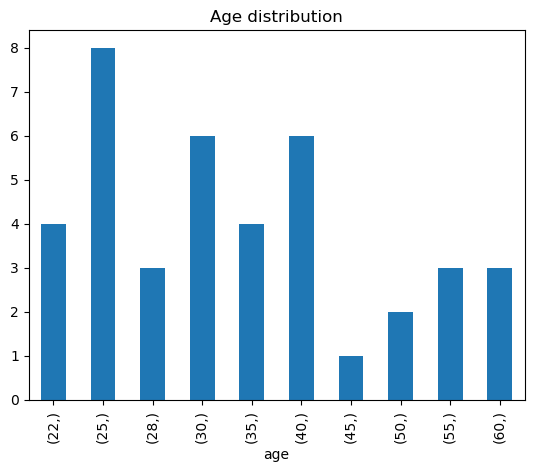

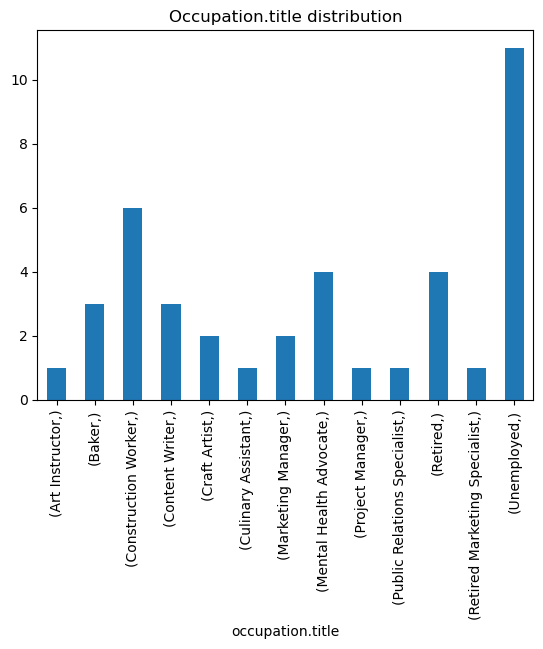

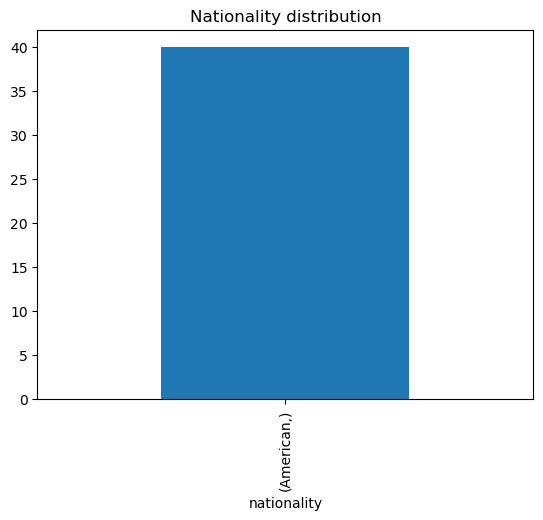

In [11]:
profiler.profile(us_singles)
save_population(us_singles, "./population/usa_singles_2/")

In [12]:
us_families = us_families_factory.generate_people(large_population_size,
                                            agent_particularities="Must be married and have young children (i.e., less than 6 years old ).", 
                                            post_processing_func=lambda x: post_process_agent(x, group="families"),
                                            verbose=True)

2025-04-17 19:26:36,514 - tinytroupe - DEBUG - -----------------------------------------> Transaction: _generate_people_in_parallel with args () and kwargs {'number_of_people': 40, 'agent_particularities': 'Must be married and have young children (i.e., less than 6 years old ).', 'temperature': 1.7, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'attempts': 10, 'post_processing_func': <function <lambda> at 0x000001BA428DAF80>, 'verbose': True} under simulation None, parallel=True.
2025-04-17 19:26:36,515 - tinytroupe - INFO - Starting the person generation based on that context: None
2025-04-17 19:26:36,519 - tinytroupe - INFO - Starting the person generation based on that context: None
2025-04-17 19:26:36,520 - tinytroupe - DEBUG - -----------------------------------------> Transaction: _initialize_sampling_plan_transaction with args () and kwargs {'n': 60, 'description': '\n        A uniform random representative sample of people from the American population. \n        Make sure 

Generated person 9/40: Talia Brooks is a 60 year old Marketing Manager, American, currently living in Boston, Massachusetts. Talia Brooks is a sociable and approachable individual who thrives on connecting with others, often using humor to foster relationships. With a strong sense of responsibility towards her family, she balances her demanding career with her role as a dedicated parent, frequently engaging in family activities and community service. Talia has a passion for cooking, enjoying the creative process of experimenting with new recipes, and she values honesty and transparency in all her interactions. Her interests in technology trends and outdoor sports reflect her desire to stay active and informed, while her commitment to education and community involvement underscores her belief in making a positive impact on those around her.


2025-04-17 19:29:30,960 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:29:30,965 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1212.
2025-04-17 19:29:30,966 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:29:30,967 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:29:31,244 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:29:31,244 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:29:31,244 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assumin

Generated person 1/40: Talia Hayes is a 25 year old Stay-at-home mother, American, currently living in Philadelphia, Pennsylvania. Talia Hayes embodies a warm and nurturing spirit, often finding joy in the little moments spent with her children. Her empathetic nature drives her to prioritize their needs, while her creativity shines through in the arts and crafts projects they undertake together. Despite the challenges of managing a household and pursuing her education, she remains dedicated to fostering a stable environment for her family. Talia's strong belief in the importance of education and community involvement reflects her desire to create a brighter future, not just for herself, but for her children as well.


2025-04-17 19:29:33,434 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS1Tk08ej98omJKA0E0eymE5zcrM', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Nina Patel",\n    "age": 30,\n    "gender": "Non-binary",\n    "nationality": "American",\n    "residence": "Los Angeles, California",\n    "education": "Some college experience, attended community college for a year focusing on early childhood education but did not complete the degree.",\n    "long_term_goals": [\n        "To provide a stable and nurturing environment for my children.",\n        "To eventually return to school and complete my education.",\n        "To find a fulfilling job that allows me to support my family while also pursuing my passions."\n    ],\n    "occupation": {\n        "title": "Stay-at-home parent",\n        "organization": "N/A",\n        "description": "You are curr

Generated person 3/40: Ethan Brooks is a 30 year old Stay-at-home parent, American, currently living in Los Angeles, California. Ethan is a nurturing and creative individual who finds joy in engaging with their children through various artistic projects, such as painting and crafting. They have a strong interest in graphic design, which they hope to pursue further by completing their degree and eventually starting their own business focused on social causes. Despite occasional anxiety about the future, Ethan maintains a positive outlook by practicing mindfulness and seeking support from their community. Their casual and approachable demeanor, combined with a good sense of humor, helps them connect with others while navigating the challenges of parenthood.


2025-04-17 19:29:43,186 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:29:43,193 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4136.
2025-04-17 19:29:43,198 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:29:43,200 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:29:43,285 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:29:43,288 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1271.
2025-04-17 19:29:43,289 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 5/40: Nina Torres is a 29 year old Art Teacher, American, currently living in Atlanta, Georgia. Nina is a warm and nurturing individual who thrives on creativity and community engagement. Her empathetic nature allows her to connect deeply with her students, fostering an environment where they feel safe to express themselves artistically. Outside of teaching, she enjoys spending quality time with her family, often engaging in arts and crafts projects that encourage her children's creativity. Nina is also passionate about sustainability, frequently incorporating recycled materials into her art, and she actively advocates for mental health awareness, believing that art can be a powerful tool for healing and self-expression.


2025-04-17 19:30:31,780 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:31,784 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1279.
2025-04-17 19:30:31,784 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:30:31,785 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:30:33,852 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS2bPuI7VFRSTDYwYE4A2ubTNbs2', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Nina is a nurturing and resilient individual who finds joy in the little moments of parenting, often using humor to connect with her children and

Generated person 10/40: Nina Patel is a 30 year old Stay-at-home parent, American, currently living in Los Angeles, California. Nina is a nurturing and resilient individual who finds joy in the little moments of parenting, often using humor to connect with her children and others. She has a playful side, enjoying arts and crafts, and is always eager to try new recipes in the kitchen. While she experiences some anxiety about the future, particularly regarding finances, she actively seeks support from parenting groups and values community connections. Nina is also committed to her long-term goals of completing her education and finding a fulfilling job that aligns with her passions, all while ensuring a stable and loving environment for her children.


2025-04-17 19:30:35,273 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:35,277 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1272.
2025-04-17 19:30:35,278 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:30:35,279 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:30:35,377 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:35,389 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4137.
2025-04-17 19:30:35,390 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:30:35,391 - tinytroupe - INFO - Calling LLM

Generated person 4/40: Gabriel Martinez is a 30 year old Stay-at-home parent, American, currently living in Los Angeles, California. Gabriel is a nurturing and creative individual who thrives on building connections with others, often using humor to foster relationships. They have a strong passion for graphic design, which allows them to express their artistic side while managing the demands of parenthood. Gabriel enjoys engaging in community events and values the support of fellow parents, often sharing experiences and tips with friends like Maria. Despite occasional anxiety about financial stability, they maintain a positive outlook and prioritize creating a loving and stable environment for their children.


2025-04-17 19:30:38,270 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:38,277 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1286.
2025-04-17 19:30:38,278 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:30:38,280 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:30:40,048 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS2iShgY8YVSrZJ6z2uE3WOD6VG9', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Victoria Torres is not only dedicated to his work but also deeply committed to his family and community. He enjoys spending weekends outdoors, of

Generated person 14/40: Victoria Torres is a 40 year old Construction Worker, American, currently living in Rural Alabama, USA. Victoria Torres is not only dedicated to his work but also deeply committed to his family and community. He enjoys spending weekends outdoors, often engaging in activities like hiking or fishing, which allow him to bond with his children and create lasting memories. With a practical sense of humor, he connects easily with friends and neighbors, often helping them with home repairs and sharing stories during gatherings. His strong belief in the importance of family and community drives him to be actively involved in local initiatives, ensuring that he contributes positively to the environment around him.


2025-04-17 19:30:41,058 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:41,062 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1214.
2025-04-17 19:30:41,062 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:30:41,063 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:30:43,009 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS2kcE7mpCc1olBV5xpJe5PR5DS9', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Dante Hayes is a dedicated family man who values hard work and community involvement. He enjoys spending his free time outdoors, often fishing or

Generated person 12/40: Dante Hayes is a 40 year old Construction Foreman, American, currently living in Rural South, USA. Dante Hayes is a dedicated family man who values hard work and community involvement. He enjoys spending his free time outdoors, often fishing or hiking with his children, and takes pride in teaching them essential life skills. With a practical and straightforward communication style, he uses humor to ease the stress of his demanding job while maintaining a strong sense of responsibility. His passion for woodworking not only showcases his craftsmanship but also allows him to create meaningful pieces for his home, reflecting his commitment to family and tradition.


2025-04-17 19:30:44,360 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:44,364 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1204.
2025-04-17 19:30:44,365 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:30:44,366 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:30:44,436 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS2fmfg2JmoHDr4flitddq6yLgLC', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Dante Brooks",\n    "age": 22,\n    "gender": "Male",\n    "nationality": "Americ

Generated person 8/40: Liam Carter-Smith is a 25 year old Stay-at-home mother, American, currently living in Newark, New Jersey. Liam Carter-Smith embodies a warm and nurturing spirit, always striving to create a loving environment for her children. She has a passion for cooking and enjoys experimenting with new recipes, often incorporating traditional family dishes that she hopes to pass down. Despite the challenges of parenting, she maintains a sense of humor, using it to lighten the mood at home. Liam is also dedicated to her personal growth, actively pursuing her GED while managing the daily responsibilities of motherhood, and she values community support, often volunteering to help other parents navigate their challenges.


2025-04-17 19:30:48,658 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:48,668 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4137.
2025-04-17 19:30:48,669 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:30:48,671 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:30:48,755 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:48,765 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4136.
2025-04-17 19:30:48,767 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 15/40: Dante Brooks is a 22 year old Stay-at-home Dad, American, currently living in Rural Midwest, USA. Dante is a nurturing and empathetic individual who finds joy in the simple pleasures of family life. He has a knack for cooking and often experiments with new recipes, making mealtime a fun and engaging experience for his children. Despite the financial stress he sometimes feels, he maintains a laid-back demeanor and uses humor to connect with others, often lightening the mood with his playful banter. His love for the outdoors and family activities reflects his commitment to creating lasting memories, while his desire to learn new skills shows his determination to improve his family's future.


2025-04-17 19:30:54,926 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:54,936 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4130.
2025-04-17 19:30:54,938 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:30:54,940 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:30:54,988 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:30:55,010 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4137.
2025-04-17 19:30:55,011 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 13/40: Ethan Ramirez is a 48 year old Unemployed, American, currently living in Rural area in the West, USA. Ethan is a deeply caring individual who prioritizes his family above all else, often finding solace in quiet moments spent with his children and pets. His reserved nature allows him to be a thoughtful listener, though he sometimes struggles with anxiety and indecision, particularly when faced with life's challenges. Despite these hurdles, he maintains a dry sense of humor that helps him navigate tough times, and he finds joy in simple pleasures like gardening and home improvement projects. Ethan's commitment to self-improvement and mental health awareness reflects his belief that everyone deserves a second chance, and he actively seeks to create a nurturing environment for his family.


2025-04-17 19:31:17,086 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:31:17,089 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1283.
2025-04-17 19:31:17,090 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:31:17,091 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:31:25,394 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS3HPkXbrySTUyKcbIcnATdXKAYn', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Sofia Johnson",\n    "age": 72,\n    "gender": "Female",\n    "nationality": "Ame

Generated person 16/40: Liam Rivera is a 25 year old Preschool Teacher, American, currently living in Boston, Massachusetts. Liam is a nurturing and patient individual who thrives on creativity, often finding innovative ways to engage her preschool students. Her warm and approachable demeanor makes her a favorite among both children and parents, as she believes in the importance of family involvement in education. Outside of her teaching role, she enjoys spending quality time with her family, exploring parks, and participating in community service, all while maintaining a balanced lifestyle through yoga and healthy cooking. Despite the challenges of juggling work and family life, her optimistic outlook and strong support network help her navigate stress and advocate for early childhood education reforms.


2025-04-17 19:31:35,803 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:31:35,806 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1261.
2025-04-17 19:31:35,807 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:31:35,808 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:31:37,435 - tinytroupe - WARNING - [3] Rate limit error, waiting a bit and trying again.
2025-04-17 19:31:37,436 - tinytroupe - INFO - Request failed. Waiting 50.0 seconds between requests...
2025-04-17 19:31:37,441 - tinytroupe - WARNING - [3] Rate limit error, waiting a bit and trying again.
2025-04-17 19:31:37,442 - tinytroupe - INFO - Request failed. Waiti

Generated person 17/40: Maya Johnson-Smith is a 40 year old Construction Worker, American, currently living in Rural South, USA. Maya Johnson-Smith is a dedicated family man who finds joy in the simple pleasures of life, such as spending weekends fishing or hiking with his children. He has a strong sense of community and often volunteers for local projects, believing that supporting one another is essential for growth. With a practical and straightforward approach to life, he values honesty and integrity, which reflects in both his work and personal relationships. Despite the challenges of his demanding job, he maintains a good sense of humor, using it to create a warm and loving environment for his family.


2025-04-17 19:31:39,064 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS3V7MAY2H0M2BLO1GuFpByGTWV1', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Dante Kim",\n    "age": 60,\n    "gender": "Male",\n    "nationality": "American",\n    "residence": "Boston, Massachusetts",\n    "education": "Harvard University, Bachelor\'s in Business Administration. Completed an MBA with a focus on family business management.",\n    "long_term_goals": [\n        "To ensure a stable and nurturing environment for my children.",\n        "To pass on family values and traditions to the next generation.",\n        "To achieve a work-life balance that allows for quality family time.",\n        "To contribute positively to my community through volunteer work."\n    ],\n    "occupation": {\n        "title": "Small Business Owner",\n        "organization": "Kim\'s F

Generated person 21/40: Sofia Johnson is a 72 year old Stay-at-home mother, American, currently living in Rural Midwest, USA. Sofia Johnson embodies a warm and nurturing spirit, often finding joy in the simple pleasures of family life. Her compassionate nature drives her to prioritize her children's needs, and she takes pride in creating a loving home environment. With a passion for gardening and cooking, she enjoys experimenting with new recipes and sharing her cultural heritage through traditional stories and meals. Despite the occasional anxiety about the future, Sofia remains dedicated to fostering a close-knit family and engaging with her community, believing that every child deserves love and support.


2025-04-17 19:31:51,948 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:31:51,958 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4134.
2025-04-17 19:31:51,960 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:31:51,962 - tinytroupe - INFO - Waiting 10.0 seconds before next API request (to avoid throttling)...
2025-04-17 19:31:52,011 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:31:52,021 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4138.
2025-04-17 19:31:52,023 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:31:52,024 - tinytroupe - INFO - Waiting 10.0 seconds before next API request (to avoid throttling)...
2025-04-17 19:31:52,475 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.


Generated person 22/40: Dante Kim is a 60 year old Small Business Owner, American, currently living in Boston, Massachusetts. Dante Kim is not only a dedicated small business owner but also a nurturing father and husband who values family above all. His warm and approachable demeanor makes him a beloved figure in his community, where he actively participates in local events and charities. With a passion for baking that he inherited from his grandmother, he takes pride in creating high-quality pastries that reflect his family's traditions. Despite the challenges of running a business, he strives for a work-life balance that allows him to spend quality time with his young children, often sharing stories from his own childhood to instill family values in them.


2025-04-17 19:31:55,461 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:31:55,465 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1233.
2025-04-17 19:31:55,467 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:31:55,468 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:31:55,775 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS3mHtJwIEVHNixYY3UFeXFNhFkl', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Nina Robinson",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "Ame

Generated person 19/40: Avery Martinez is a 45 year old Stay-at-home parent, American, currently living in Hilo, Hawaii. Avery is a nurturing and resilient individual who deeply values family and community. With a strong sense of responsibility, they prioritize their children's well-being while also seeking ways to contribute positively to their local environment. Avery enjoys cooking and experimenting with new recipes, often involving their children in the process, which fosters both creativity and bonding. They are also committed to maintaining a balanced routine that includes mindfulness practices to manage stress, reflecting their belief in the importance of mental health for parents.


2025-04-17 19:32:17,660 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:17,662 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1232.
2025-04-17 19:32:17,662 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:32:17,664 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:32:24,687 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS4GP7UKUt15qEY9hEiXwv75F86Q', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Elijah Johnson",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "Am

Generated person 7/40: Nina Torres-Garcia is a 55 year old Stay-at-home mother, American, currently living in Newark, New Jersey. Nina Torres-Garcia embodies a warm and nurturing spirit, often using her empathetic nature to connect with her children and those around her. She finds joy in reading children's literature and enjoys engaging in community events, which reflect her strong belief in the importance of education and support for families. Despite the challenges of parenting, she practices mindfulness and yoga to maintain her mental well-being, and she is dedicated to creating a peaceful home environment. Nina's passion for cooking healthy meals and her love for crafting further showcase her creativity and commitment to providing a nurturing atmosphere for her family.


2025-04-17 19:32:36,743 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:36,746 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1315.
2025-04-17 19:32:36,747 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:32:36,747 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:32:38,690 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS4c8n5IXKAKrJVk6zTx3wefvNbH', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Isaiah Ramirez is not only dedicated to his role as a Marketing Manager but also embodies a warm and approachable personality that makes him a fa

Generated person 11/40: Isaiah Ramirez is a 33 year old Marketing Manager, American, currently living in Seattle, Washington. Isaiah Ramirez is not only dedicated to his role as a Marketing Manager but also embodies a warm and approachable personality that makes him a favorite among colleagues and friends. His love for family is evident in his commitment to spending quality time with his children, often engaging in playful activities that foster their curiosity. Isaiah's passion for cooking allows him to explore new recipes, which he enjoys sharing with his family during their gatherings. With a strong belief in the importance of education and community involvement, he actively participates in local events and volunteers at his children's school, reinforcing his values of nurturing and growth.


2025-04-17 19:32:39,464 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:39,468 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4139.
2025-04-17 19:32:39,469 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:32:39,470 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:32:39,560 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:39,562 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1267.
2025-04-17 19:32:39,563 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 25/40: Nina Robinson is a 28 year old Stay-at-home mom, American, currently living in Chicago, Illinois. Nina is a warm and nurturing individual who thrives on creating a loving environment for her children. She has a passion for arts and crafts, often engaging in creative activities that not only entertain her kids but also foster their development. Despite the pressures of financial constraints, she maintains a good sense of humor, using it to lighten the mood during challenging times. Nina values community support and actively participates in local events, believing that every child deserves love and attention, which reflects her deep commitment to family and education.


2025-04-17 19:32:42,167 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:42,170 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1270.
2025-04-17 19:32:42,171 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:32:42,172 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:32:44,040 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS4impTiArTLHfYgGgkou77J8s5N', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Zara is a nurturing and dedicated father who finds joy in the little moments spent with his children. His quirky sense of humor often lightens th

Generated person 20/40: Zara Thompson-Jones is a 22 year old Stay-at-home Dad, American, currently living in Rural Midwest, USA. Zara is a nurturing and dedicated father who finds joy in the little moments spent with his children. His quirky sense of humor often lightens the mood during busy days, and he enjoys sharing cooking tips with friends and family, reflecting his belief that cooking is a way to show love. Despite feeling overwhelmed at times, he maintains a positive outlook and is committed to creating a stable and loving environment for his kids. Zara's passion for gardening and cooking not only provides healthy meals but also serves as a creative outlet, allowing him to bond with his family over homemade dishes and outdoor activities.


2025-04-17 19:32:44,667 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:44,669 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1342.
2025-04-17 19:32:44,670 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:32:44,671 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:32:46,709 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS4ksyDzrUPnNxnOPGjJN3gbvwmX', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Sofia Adams is not only dedicated to her role as a preschool teacher but also embodies a nurturing spirit that extends into her personal life. Sh

Generated person 18/40: Sofia Adams is a 25 year old Preschool Teacher, American, currently living in Boston, Massachusetts. Sofia Adams is not only dedicated to her role as a preschool teacher but also embodies a nurturing spirit that extends into her personal life. She has a creative flair, often engaging her children in arts and crafts, and enjoys cooking healthy meals that bring the family together. Sofia is an optimistic individual who values community involvement, frequently volunteering for school events and local initiatives that advocate for children's rights. Balancing her professional and family responsibilities can be challenging, but she finds joy in creating a structured routine that fosters both learning and quality time with her loved ones.


2025-04-17 19:32:48,823 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:48,869 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:48,870 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4140.
2025-04-17 19:32:48,873 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:32:48,875 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:32:48,915 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1268.
2025-04-17 19:32:48,918 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 24/40: Talia Robinson is a 25 year old Preschool Teacher, American, currently living in Boston, Massachusetts. Talia Robinson is not only a dedicated preschool teacher but also a nurturing mother who values family time and emotional well-being. Her warm and approachable personality shines through in her interactions, as she often uses humor to connect with both her students and their parents. With a strong interest in child development and a passion for arts and crafts, Talia enjoys creating engaging lesson plans that cater to diverse learning styles. Despite the challenges of balancing work and family life, she remains optimistic and believes in the potential of every child, advocating for inclusive education and healthy eating habits.


2025-04-17 19:32:55,260 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:55,273 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4141.
2025-04-17 19:32:55,275 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:32:55,276 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:32:55,637 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:55,641 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1251.
2025-04-17 19:32:55,643 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 23/40: Elijah Johnson is a 28 year old Stay-at-home mom, American, currently living in Chicago, Illinois. Elijah Johnson is a warm and nurturing individual who thrives on creating a loving environment for her children. With a strong interest in parenting and child development, she often engages in educational activities and arts and crafts with her kids, fostering their creativity and learning. Despite the challenges of managing a household and the occasional stress of financial uncertainty, she maintains a good sense of humor, which helps lighten the mood at home. Elijah is also dedicated to her community, frequently volunteering at her children's preschool and participating in local parenting groups, where she finds support and camaraderie with other moms.


2025-04-17 19:32:57,938 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:57,956 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4137.
2025-04-17 19:32:57,960 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:32:57,962 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:32:58,016 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:32:58,031 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4134.
2025-04-17 19:32:58,034 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 28/40: Mason Carter is a 37 year old Stay-at-home dad, American, currently living in Rural Midwest, USA. Mason is a nurturing and patient individual who thrives on creating a loving environment for his children. He enjoys cooking and baking with them, often experimenting with new recipes while sharing family traditions. His friendly demeanor and good sense of humor make him approachable, allowing him to connect easily with others in his community. Although he sometimes feels overwhelmed by his responsibilities, he manages stress through humor and the support of his close-knit group of friends, who share parenting tips and experiences.


2025-04-17 19:33:19,012 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:33:19,017 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1277.
2025-04-17 19:33:19,019 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:33:19,021 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:33:26,746 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS5FpKk1ApH0GkqQpdMvqeqgo5mI', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Elena Martinez-Williams",\n    "age": 30,\n    "gender": "Non-binary",\n    "nati

Generated person 33/40: Victoria Adams-Brown is a 90 year old Homemaker, American, currently living in Rural West, USA. Victoria Adams-Brown embodies a warm and nurturing spirit, often reflecting on her cherished memories while sharing valuable life lessons with her children. Her love for cooking and gardening not only fills her home with delicious aromas and vibrant colors but also serves as a way to bond with her family, teaching them the importance of tradition and hard work. Despite her occasional worries about the future, she remains steadfast in her beliefs, finding comfort in her routines and the support of her husband, James. Victoria's dedication to preserving family history and values shines through in her interactions, making her a beloved matriarch in her close-knit family.


2025-04-17 19:33:40,981 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:33:40,984 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1367.
2025-04-17 19:33:40,985 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:33:40,987 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:33:43,367 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS5eiK3iTHwfoZ1qbYy6kzIuNiRN', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Elijah Carter-Williams is a nurturing and empathetic individual who thrives on creativity and connection. With a passion for child development, s

Generated person 26/40: Elijah Carter-Williams is a 25 year old Preschool Teacher, American, currently living in Boston, Massachusetts. Elijah Carter-Williams is a nurturing and empathetic individual who thrives on creativity and connection. With a passion for child development, she enjoys incorporating arts and crafts into her teaching, making learning both fun and engaging for her students. Outside of the classroom, Elijah values family time and often participates in community events, reflecting her belief in the importance of support networks for working parents. Despite the challenges of balancing work and family life, she practices self-care through yoga and mindfulness, ensuring she remains grounded and focused on her long-term goals of advocating for early childhood education reforms.


2025-04-17 19:33:44,917 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:33:44,929 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4136.
2025-04-17 19:33:44,931 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:33:44,933 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:33:45,906 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:33:45,910 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1284.
2025-04-17 19:33:45,911 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 31/40: Liam Carter is a 55 year old Stay-at-home parent, American, currently living in Boston, Massachusetts. Liam Carter embodies a warm and nurturing spirit, always prioritizing the well-being of her family. With a strong background in education, she enjoys engaging her children in meaningful activities that foster their curiosity and development. Her empathetic nature drives her to volunteer in the community, where she believes in the importance of creating a supportive environment for all children. In her free time, Liam finds joy in cooking healthy meals and practicing mindfulness, which helps her maintain a balanced lifestyle amidst the challenges of parenting.


2025-04-17 19:33:51,464 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:33:51,491 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4136.
2025-04-17 19:33:51,493 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:33:51,495 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:33:51,560 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:33:51,571 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4133.
2025-04-17 19:33:51,574 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 29/40: Liam Rivera-Sanchez is a 25 year old Preschool Teacher, American, currently living in Boston, Massachusetts. Liam Rivera-Sanchez is a nurturing and empathetic individual who thrives on creativity and playfulness in both her teaching and personal life. She has a strong passion for child development and enjoys engaging in arts and crafts, often incorporating these activities into her lesson plans. Outside of the classroom, Liam values community and family time, frequently organizing weekend outings and participating in local events. With a commitment to lifelong learning, she actively seeks professional development opportunities to enhance her skills and believes in the importance of mental health and well-being for both children and parents.


2025-04-17 19:34:21,810 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:34:21,816 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1257.
2025-04-17 19:34:21,817 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:34:21,821 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:34:24,109 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS6JZh5w34yeoYVEFpN2BFMTlUwH', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Elena is a nurturing and warm individual who thrives on creating a stable and loving environment for her children. With a playful spirit, she enj

Generated person 27/40: Elena Martinez-Williams is a 30 year old Stay-at-home parent, American, currently living in Los Angeles, California. Elena is a nurturing and warm individual who thrives on creating a stable and loving environment for her children. With a playful spirit, she enjoys engaging in creative activities like arts and crafts, which not only fosters her children's development but also allows her to express her own creativity. Despite the occasional anxiety about financial stability, she maintains a positive outlook and practices mindfulness to manage stress. Elena values community support and often seeks out parenting groups, reflecting her belief in the importance of connection and shared experiences among families.


2025-04-17 19:34:25,836 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:34:25,841 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1238.
2025-04-17 19:34:25,842 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:34:25,860 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:34:27,493 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS6FejpsHBfoX0LcQKCQZB8EkNWi', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Zara Thompson",\n    "age": 33,\n    "gender": "Male",\n    "nationality": "Ameri

Generated person 36/40: Ethan Carter is a 66 year old Financial Analyst, American, currently living in Boston, Massachusetts. Ethan Carter is a dedicated family man who values quality time with his loved ones, often organizing family game nights and weekend getaways to create lasting memories. He has a pragmatic approach to life, using humor to ease tense situations, and enjoys mentoring younger colleagues, sharing his extensive knowledge in finance. With a strong sense of duty, he actively participates in community service and believes in the importance of financial literacy for everyone. Despite the pressures of his job, he maintains a balanced routine, prioritizing family dinners and engaging discussions about current events, all while nurturing his passion for cooking and travel.


2025-04-17 19:34:39,668 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:34:39,673 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1244.
2025-04-17 19:34:39,675 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:34:39,677 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:34:41,392 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS6biaQJa9mll2hL9upKZlZF4DuA', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Jasper is a nurturing individual who places great importance on family and community. He enjoys engaging in outdoor activities with his children,

Generated person 32/40: Jasper Martinez is a 45 year old Unemployed, American, currently living in Hilo, Hawaii. Jasper is a nurturing individual who places great importance on family and community. He enjoys engaging in outdoor activities with his children, often taking them on hikes to explore the beautiful Hawaiian landscape. With a strong sense of responsibility, he actively seeks to improve his financial literacy to create a secure future for his family. Jasper's caring nature is complemented by his culinary skills, as he loves preparing healthy meals and fostering a love for reading through bedtime stories with his kids.


2025-04-17 19:34:42,977 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:34:42,983 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1277.
2025-04-17 19:34:42,984 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:34:42,986 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:34:44,922 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS6f0Oy5tIyV1lChYBYVuC49agTM', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Elena is not only dedicated to her career but also deeply values her family life, often planning engaging activities to create lasting memories w

Generated person 38/40: Elena Martinez is a 33 year old Marketing Manager, American, currently living in San Francisco, California. Elena is not only dedicated to her career but also deeply values her family life, often planning engaging activities to create lasting memories with her children. Her optimistic outlook and organized nature help her navigate the pressures of her job while maintaining a healthy work-life balance. Passionate about personal development, she enjoys reading and listening to podcasts that inspire her both professionally and personally. Additionally, her commitment to community involvement reflects her belief in the importance of giving back and fostering a supportive environment for those around her.


2025-04-17 19:34:46,747 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:34:46,753 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1233.
2025-04-17 19:34:46,755 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:34:46,757 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:34:49,578 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS6i0wFhAwrlFesViazExfUc64yQ', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Rafael Torres embodies a warm and nurturing spirit, always prioritizing her children's emotional and educational needs. With a background in earl

Generated person 34/40: Rafael Torres is a 55 year old Stay-at-home mother, American, currently living in Boston, Massachusetts. Rafael Torres embodies a warm and nurturing spirit, always prioritizing her children's emotional and educational needs. With a background in early childhood education, she creatively engages her kids in activities that foster learning and imagination, often incorporating arts and crafts into their daily routines. Her empathetic nature drives her to advocate for children's rights and education reform, reflecting her belief that every child deserves a supportive environment. In her free time, she enjoys reading children's literature, gardening with her kids, and practicing mindfulness, all while maintaining a strong connection with her community through volunteering and local events.


2025-04-17 19:34:51,427 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:34:51,433 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1198.
2025-04-17 19:34:51,443 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:34:51,445 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:34:53,573 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS6nkfCXWj99gkvsGJOjIek7QvLv', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Gabriel Torres is a dedicated family man who finds joy in the simple pleasures of life, such as spending weekends outdoors with his children, fis

Generated person 37/40: Gabriel Torres is a 40 year old Construction Worker, American, currently living in Rural Alabama, USA. Gabriel Torres is a dedicated family man who finds joy in the simple pleasures of life, such as spending weekends outdoors with his children, fishing, or hiking. He values hard work and believes that perseverance is key to success, often reflecting on his upbringing to instill similar values in his kids. While he tends to be reserved and prefers small gatherings, he is friendly and willing to lend a hand to neighbors in need. Gabriel's practical nature is complemented by his strong problem-solving skills, making him a reliable figure both at work and in his community.


2025-04-17 19:34:56,934 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:34:57,008 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4136.
2025-04-17 19:34:57,017 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:34:57,022 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:34:57,422 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:34:57,439 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1272.
2025-04-17 19:34:57,441 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 39/40: Zara Thompson is a 33 year old Marketing Manager, American, currently living in Seattle, Washington. Zara is known for his friendly and approachable demeanor, often using humor to connect with colleagues and friends. He has a strong passion for cooking, frequently experimenting with new recipes to ensure his family enjoys healthy meals. In his free time, he loves to explore the outdoors, whether it's hiking with his family or visiting local attractions. Zara values education and personal growth, believing that continuous learning is essential, and he actively engages in community events to support those around him.


2025-04-17 19:35:08,169 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS6tevZ4oamzgTM8CXO7JeaYi0yO', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Zara Patel",\n    "age": 40,\n    "gender": "Male",\n    "nationality": "American",\n    "residence": "Rural South, USA",\n    "education": "High School Graduate. Completed vocational training in carpentry and construction management.",\n    "long_term_goals": [\n        "To provide a stable and loving environment for my children.",\n        "To save enough money to buy a home and secure my family\'s future.",\n        "To be actively involved in my community and support local initiatives."\n    ],\n    "occupation": {\n        "title": "Construction Worker",\n        "organization": "Local Construction Company",\n        "description": "You work as a construction worker, specializing in resident

Generated person 35/40: Zara Patel is a 40 year old Construction Worker, American, currently living in Rural South, USA. Zara Patel is a dedicated and hardworking individual who takes great pride in his craftsmanship as a construction worker. He enjoys spending quality time outdoors with his family, often engaging in activities like fishing and hiking, which allow him to unwind from the demands of his job. Although he tends to be reserved and prefers quiet evenings at home, he values loyalty and trust in his relationships, especially with his supportive wife, Lisa. Zara is also committed to his community, frequently helping neighbors with home repairs and participating in local events, reflecting his belief that community support is essential for a better life.


2025-04-17 19:35:14,304 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:35:14,309 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1168.
2025-04-17 19:35:14,311 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:35:14,315 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:35:19,696 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS7Dnc6r2XUfjbO2K4DwitSRE9JM', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Rafael is a nurturing individual who finds joy in the simple pleasures of life, particularly in spending time outdoors with his children. His war

Generated person 40/40: Rafael Adams is a 45 year old Unemployed, American, currently living in Hilo, Hawaii. Rafael is a nurturing individual who finds joy in the simple pleasures of life, particularly in spending time outdoors with his children. His warm and approachable demeanor makes him well-liked in his community, where he actively participates in local events and volunteers whenever possible. Despite the challenges he faces, Rafael maintains a positive outlook, often using his good sense of humor to uplift those around him. He is passionate about preserving Hawaiian culture and enjoys sharing its traditions with his family, all while managing to cultivate a small vegetable garden that he tends to with his children.


2025-04-17 19:35:22,524 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:35:22,528 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1268.
2025-04-17 19:35:22,530 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:35:22,577 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:35:24,461 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS7IXm9wR7djHho7zttWCmaTUvb3', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Samuel White-Blackwell is a warm and nurturing individual who thrives on creating a supportive environment for her children. With a strong backgr

Generated person 30/40: Samuel White-Blackwell is a 55 year old Stay-at-home parent, American, currently living in Boston, Massachusetts. Samuel White-Blackwell is a warm and nurturing individual who thrives on creating a supportive environment for her children. With a strong background in education, she enjoys engaging in educational activities and reading children's literature, fostering a love for learning in her kids. Her empathetic nature drives her to volunteer in the community, where she collaborates with others who share her values. Despite occasional stress related to parenting, she practices mindfulness and yoga to maintain her well-being, ensuring she remains a patient and attentive presence in her children's lives.


2025-04-17 19:36:37,480 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:36:37,482 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:36:47,658 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNS8Vpg5ehiKOb5YfPEW8cwmaXXxc', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Sof

Generated person 6/40: Sofia Bennett is a 22 year old Stay-at-home Dad, American, currently living in Rural Midwest, USA. Sofia Bennett is a nurturing and caring individual who finds joy in the simple moments spent with his children, such as cooking and baking together. Despite feeling overwhelmed by his responsibilities and the pressures of financial instability, he maintains a positive attitude and is dedicated to providing a loving environment for his family. He enjoys gardening and spending time outdoors, often using these activities as a way to bond with his kids. Sofia values family above all else and believes in the importance of hard work and dedication to create a better future for his loved ones.


2025-04-17 19:36:52,827 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:36:52,833 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1306.
2025-04-17 19:36:52,834 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:36:52,836 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:36:54,640 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNS8kPYqIHnfHu7X7u2e4ElpccIID', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Nina Foster is a nurturing and empathetic individual who deeply values family life. He enjoys cooking and baking, often experimenting with new re

Generated person 2/40: Nina Foster is a 22 year old Stay-at-home Dad, American, currently living in Rural Midwest, USA. Nina Foster is a nurturing and empathetic individual who deeply values family life. He enjoys cooking and baking, often experimenting with new recipes that he shares on social media to inspire others. Despite his occasional struggles with anxiety, he finds joy in simple pleasures like nature walks and family game nights. Nina is resourceful and dedicated to creating a loving environment for his children, while also seeking to improve his financial situation and learn new skills for the future.


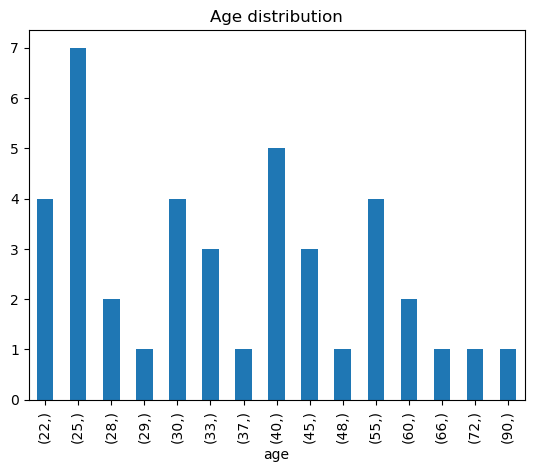

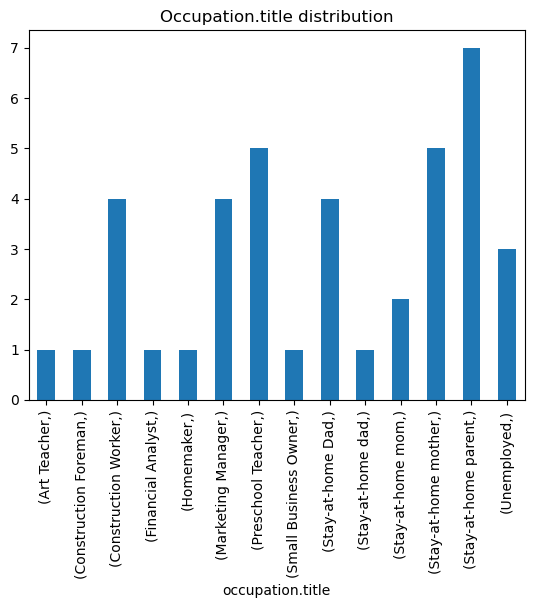

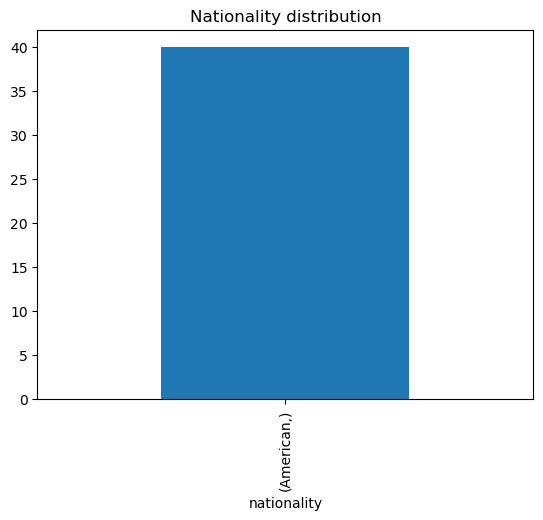

In [13]:
profiler.profile(us_families)
save_population(us_families, "./population/usa_families_2/")

In [14]:
us_couples = us_couples_factory.generate_people(large_population_size, 
                                         agent_particularities="Must either be married or have a girlfriend/boyfriend. Must have no children.", 
                                         post_processing_func=lambda x: post_process_agent(x, group="couples"),
                                         verbose=True)

2025-04-17 19:36:55,697 - tinytroupe - DEBUG - -----------------------------------------> Transaction: _generate_people_in_parallel with args () and kwargs {'number_of_people': 40, 'agent_particularities': 'Must either be married or have a girlfriend/boyfriend. Must have no children.', 'temperature': 1.7, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'attempts': 10, 'post_processing_func': <function <lambda> at 0x000001BA428DAF80>, 'verbose': True} under simulation None, parallel=True.
2025-04-17 19:36:55,700 - tinytroupe - INFO - Starting the person generation based on that context: None
2025-04-17 19:36:55,705 - tinytroupe - INFO - Starting the person generation based on that context: None
2025-04-17 19:36:55,707 - tinytroupe - DEBUG - -----------------------------------------> Transaction: _initialize_sampling_plan_transaction with args () and kwargs {'n': 60, 'description': '\n        A uniform random representative sample of people from the American population. \n        Make

Generated person 12/40: Sofia Patel-Jones is a 50 year old Marketing Manager, American, currently living in Atlanta, Georgia. Sofia Patel-Jones is known for her ambitious and driven nature, always striving for personal and professional growth. She enjoys socializing and often uses humor to connect with her colleagues, creating a friendly and approachable atmosphere at work. In her free time, Sofia is passionate about cooking and exploring different cultures through food, often hosting dinner parties for friends and family. Additionally, she is dedicated to community involvement, regularly volunteering at local charities and mentoring young professionals, reflecting her belief that everyone deserves a chance to improve their circumstances.


2025-04-17 19:39:38,860 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:39:38,874 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4149.
2025-04-17 19:39:38,876 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:39:38,879 - tinytroupe - INFO - Waiting 10.0 seconds before next API request (to avoid throttling)...
2025-04-17 19:39:38,939 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:39:38,950 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4155.
2025-04-17 19:39:38,953 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:39:38,956 - tinytroupe - INFO - Waiting 10.0 seconds before next API request (to avoid throttling)...
2025-04-17 19:39:39,270 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.


Generated person 5/40: Liam Torres-Moore is a 60 year old Retired Public Health Advocate, American, currently living in San Francisco, California. Liam Torres-Moore is known for her warm and approachable demeanor, often using humor to connect with others. She has a deep empathy for those around her, which drives her commitment to community service and advocacy for seniors. In her free time, she enjoys gardening, reading, and experimenting with healthy recipes, often hosting dinner parties to share her culinary creations with friends and family. With a strong belief in lifelong learning, she actively participates in community events and workshops, always eager to inspire others and promote healthy living.


2025-04-17 19:39:45,669 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSBNJOR6fXvCMp9TIT05tGX2CcWk', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Sofia Adams-Williams",\n    "age": 50,\n    "gender": "Male",\n    "nationality": "American",\n    "residence": "Atlanta, Georgia",\n    "education": "University of Georgia, Bachelor\'s Degree in Business Administration. Specialized in Marketing. Completed various professional development courses in digital marketing and project management.",\n    "long_term_goals": [\n        "To achieve a senior management position in a reputable company.",\n        "To travel extensively with my spouse and explore different cultures.",\n        "To contribute to community development through local charities."\n    ],\n    "occupation": {\n        "title": "Marketing Manager",\n        "organization": "Tech Inn

Generated person 7/40: Zara Johnson-Smith is a 25 year old Marketing Specialist, American, currently living in Boston, Massachusetts. Zara Johnson-Smith is known for her friendly and approachable demeanor, often using humor to foster connections with her colleagues. She thrives in social settings, enjoying networking and collaborating on creative projects, which is evident in her strong communication skills. Outside of work, Zara has a passion for traveling and photography, frequently sharing her adventures and culinary experiments with friends. She values community involvement and maintains a healthy lifestyle, balancing her professional ambitions with personal interests like fitness and volunteering.


2025-04-17 19:40:00,982 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:40:00,994 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4145.
2025-04-17 19:40:00,996 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:40:00,998 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:40:03,539 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:40:03,545 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1227.
2025-04-17 19:40:03,556 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 10/40: Sofia Adams-Williams is a 50 year old Marketing Manager, American, currently living in Atlanta, Georgia. Sofia Adams-Williams is known for her ambitious and driven nature, always striving to enhance her skills and knowledge in marketing. With a friendly demeanor, she fosters a collaborative work environment, though she sometimes finds it challenging to delegate tasks. Outside of work, Sofia enjoys cooking and experimenting with new recipes, often sharing these culinary adventures with her supportive spouse, Emily. She values community involvement and regularly participates in local service projects, believing that giving back enriches both her personal and professional life.


2025-04-17 19:40:11,323 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:40:11,337 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4142.
2025-04-17 19:40:11,339 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:40:11,342 - tinytroupe - INFO - Waiting 10.0 seconds before next API request (to avoid throttling)...
2025-04-17 19:40:11,647 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:40:11,673 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4144.
2025-04-17 19:40:11,675 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:40:11,678 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [],

Generated person 2/40: Liam Torres-Garcia is a 50 year old Marketing Manager, American, currently living in Atlanta, Georgia. Liam is a detail-oriented individual who thrives on organization and reliability, which is evident in both his professional and personal life. He enjoys the creative aspects of marketing but often balances this with the pressures of meeting sales targets, leading him to develop strong analytical skills. Outside of work, he has a passion for cooking and often experiments with new recipes, reflecting his love for diverse cultures. Liam values community involvement and regularly participates in local charity events, believing that giving back is essential for personal fulfillment.


2025-04-17 19:40:40,315 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:40:40,482 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4148.
2025-04-17 19:40:40,489 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:40:40,492 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:40:42,130 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:40:42,137 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1254.
2025-04-17 19:40:42,139 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 11/40: Jasper Lee-Roberts is a 60 year old Retired Social Worker, American, currently living in San Francisco, California. Jasper Lee-Roberts embodies a warm and nurturing spirit, making her a beloved figure in her community. Her strong sense of justice drives her to advocate tirelessly for mental health resources, particularly for seniors, reflecting her deep compassion for vulnerable populations. In her free time, she enjoys gardening, which not only provides her with fresh ingredients for healthy meals but also serves as a therapeutic outlet. With a passion for writing, she is currently working on a memoir that captures her life experiences and the importance of mental health, aiming to inspire others through her journey.


2025-04-17 19:41:04,017 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:04,030 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4142.
2025-04-17 19:41:04,033 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:41:04,036 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:41:06,039 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:06,045 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1273.
2025-04-17 19:41:06,047 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 3/40: Oliver Hayes-Smith is a 35 year old Art Teacher, American, currently living in Atlanta, Georgia. Oliver Hayes-Smith is not only a dedicated art teacher but also a passionate advocate for inclusivity and social change through art. With a warm and approachable demeanor, he fosters a creative environment where students feel encouraged to express their emotions and ideas. Outside the classroom, Oliver enjoys exploring local art galleries and participating in community service projects, often collaborating with his spouse, Jordan, on artistic endeavors. His love for bright colors and bold patterns reflects his vibrant personality, and he finds inspiration in nature, which he often visits on weekends to recharge and gather new ideas for his art.


2025-04-17 19:41:11,585 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:11,591 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1244.
2025-04-17 19:41:11,593 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:41:11,594 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:41:20,966 - tinytroupe - WARNING - [1] Rate limit error, waiting a bit and trying again.
2025-04-17 19:41:20,967 - tinytroupe - INFO - Request failed. Waiting 2 seconds between requests...
2025-04-17 19:41:21,229 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSD3g8QV87mnAmQFUPDnDjShm4eS', choices=[Choice(finish_reason='stop', index

Generated person 14/40: Elijah Carter-Jones is a 50 year old Marketing Manager, American, currently living in Atlanta, Georgia. Elijah Carter-Jones is not only a dedicated Marketing Manager but also a passionate individual who thrives on continuous learning and personal growth. He enjoys engaging in discussions about current events and technology, often sharing insights with friends and family. With a love for cooking, he frequently experiments with new recipes alongside his wife, making their evenings a delightful blend of culinary exploration and quality time. His commitment to community involvement reflects his belief in the importance of giving back, as he regularly volunteers at local charities, further enriching his life and the lives of those around him.


2025-04-17 19:41:22,660 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:22,672 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4145.
2025-04-17 19:41:22,674 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:41:22,677 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:41:22,746 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:22,751 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1205.
2025-04-17 19:41:22,753 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 13/40: Nina Hayes-Roberts is a 55 year old Community Organizer, American, currently living in Newark, New Jersey. Nina Hayes-Roberts is known for her warm and approachable demeanor, often using humor to connect with those around her. She has a deep empathy for others, which drives her commitment to mental health advocacy and community service. In her free time, she enjoys quiet evenings with a good book, particularly literature that explores themes of identity and belonging, and she finds joy in cooking and hosting dinner parties for friends. Nina also values cultural understanding, stemming from her bilingual upbringing, and she actively engages in mindfulness practices to manage the stress that comes with her important work.


2025-04-17 19:41:30,881 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:30,885 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1242.
2025-04-17 19:41:30,886 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:41:30,888 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:41:33,013 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:41:33,618 -

Generated person 9/40: Gabriel Lee-Smith is a 25 year old Marketing Specialist, American, currently living in Boston, Massachusetts. Gabriel is known for her friendly and approachable demeanor, often using humor to connect with her colleagues. She thrives in social settings, enjoying the camaraderie of brainstorming sessions and team-building activities. Outside of work, she has a passion for traveling and exploring new cultures, which she often documents through her photography. Gabriel also values her relationships deeply, prioritizing time with her husband and friends, and actively participates in community service projects, reflecting her belief in the importance of diversity and inclusion.


2025-04-17 19:41:39,767 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:39,774 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1195.
2025-04-17 19:41:39,776 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:41:39,777 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:41:42,067 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSDNgobO3Bns8ft5XvkRuAP2wCe1', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Liam is an optimistic and creative individual who thrives in collaborative environments, often using humor to connect with colleagues. Outside of

Generated person 17/40: Liam Patel-Smith is a 25 year old Marketing Specialist, American, currently living in Boston, Massachusetts. Liam is an optimistic and creative individual who thrives in collaborative environments, often using humor to connect with colleagues. Outside of work, she enjoys exploring new cultures through travel and photography, and she finds joy in cooking and sharing meals with friends. With a strong belief in community involvement, she dedicates her weekends to volunteering and engaging in outdoor activities, such as hiking with her dog, Bella. Despite occasionally feeling overwhelmed by work pressures, she maintains a healthy work-life balance through exercise, mindfulness, and quality time with her husband, Mark.


2025-04-17 19:41:43,128 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:43,139 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4154.
2025-04-17 19:41:43,142 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:41:43,143 - tinytroupe - INFO - Waiting 250.0 seconds before next API request (to avoid throttling)...
2025-04-17 19:41:43,750 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSDGxtj6tQt6BQgCiZtv9crSwCiF', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Ethan Brooks",\n    "age": 55,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Newark, New Jersey",\n    "education": "Columbia University, Graduate Degree in Social Work. Focused on community development and mental health services.",\n    "

Generated person 8/40: Elena Martinez-Garcia is a 30 year old Game Developer, American, currently living in San Francisco, California. Elena is not only a talented game developer but also a passionate advocate for social justice and mental health awareness. Their imaginative spirit shines through in their work, as they often explore unique narratives that challenge conventional gaming norms. With a playful sense of humor, Elena fosters a welcoming environment for collaboration, making it easy for others to share their ideas. Outside of work, they enjoy attending gaming conventions, engaging in community service, and spending quality time with their partner and friends, all while nurturing their beloved cat, Pixel, who provides companionship during their creative endeavors.


2025-04-17 19:41:48,352 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:48,366 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4148.
2025-04-17 19:41:48,367 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:41:48,369 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:41:48,651 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:41:48,665 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4139.
2025-04-17 19:41:48,666 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 6/40: Sofia Johnson-Brown is a 55 year old Retired Social Worker, American, currently living in New York City, New York. Sofia Johnson-Brown embodies a warm and nurturing spirit, often drawing on her rich background in social work to connect deeply with others. Her reflective nature allows her to contemplate life's complexities, and she often engages in meaningful conversations about mental health and resilience. With a passion for literature, particularly works by Latin American authors, she finds joy in quiet evenings spent reading or cooking traditional dishes for friends. Sofia's commitment to mental health advocacy is evident in her volunteer work, where she channels her empathy and strong interpersonal skills to support those in need, all while maintaining a sense of humor that lightens the mood in challenging situations.


2025-04-17 19:42:03,239 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSDTBSMdv0yihqar2NQF6ewa2LbO', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Ethan Brooks",\n    "age": 55,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "New York City, New York",\n    "education": "Columbia University, Graduate Degree in Social Work. Focused on community mental health and social justice issues.",\n    "long_term_goals": [\n        "To advocate for mental health awareness and support in underserved communities.",\n        "To write a book about personal experiences and the importance of community support.",\n        "To travel and explore different cultures, particularly in Latin America."\n    ],\n    "occupation": {\n        "title": "Retired Social Worker",\n        "organization": "N/A",\n        "description": "You are a

Generated person 20/40: Liam Torres-Brown is a 22 year old Unemployed, American, currently living in Rural Midwest, USA. Liam is a creative individual who finds joy in experimenting with new recipes, often using fresh ingredients sourced from local farmers' markets. His passion for cooking is not just a hobby; he views it as an art form that fosters connection and community. Despite his anxiety and tendency to overthink, he maintains a good sense of humor and values deep relationships, particularly with his girlfriend Emily, who shares his culinary interests. In his downtime, he enjoys quiet evenings filled with cooking shows, reading cookbooks, and refining his baking skills, all while dreaming of one day opening his own bakery.


2025-04-17 19:42:12,407 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:42:12,413 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1311.
2025-04-17 19:42:12,414 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:42:12,415 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:42:21,757 - tinytroupe - WARNING - [1] Rate limit error, waiting a bit and trying again.
2025-04-17 19:42:21,758 - tinytroupe - INFO - Request failed. Waiting 2 seconds between requests...
2025-04-17 19:42:22,173 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSE2DfF5UBBvh8ATCA48q9hTW4X3', choices=[Choice(finish_reason='stop', index

Generated person 22/40: Victoria Adams-Kim is a 60 year old Retired Public Health Advocate, American, currently living in San Francisco, California. Victoria Adams-Kim is known for her warm and approachable demeanor, often using humor to connect with those around her. She has a deep passion for community service, regularly volunteering at local health clinics and participating in health fairs, where she shares her extensive knowledge of public health policies. An avid gardener, she enjoys growing her own vegetables and herbs, which she incorporates into her cooking, reflecting her love for exploring diverse cuisines. Victoria values education and believes that community engagement is essential for improving public health, making her a respected figure in her local community.


2025-04-17 19:42:23,766 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:42:23,778 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4148.
2025-04-17 19:42:23,780 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:42:23,783 - tinytroupe - INFO - Waiting 10.0 seconds before next API request (to avoid throttling)...
2025-04-17 19:42:23,815 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:42:23,827 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4147.
2025-04-17 19:42:23,829 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:42:23,831 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [],

Generated person 19/40: Nina Robinson-Smith is a 30 year old Freelance Graphic Designer, American, currently living in San Francisco, California. Nina is an outgoing and empathetic individual who thrives in social settings, often engaging in discussions about social issues with friends. With a playful sense of humor, they use creativity as a powerful tool for social change, advocating for diversity and inclusion in all aspects of life. In their free time, Nina enjoys exploring local art galleries, playing indie video games, and spending time with their supportive partner, Jordan, and close friend, Alex. They also prioritize self-care and stress management through practices like meditation and yoga, ensuring a healthy balance between work and personal passions.


2025-04-17 19:42:31,312 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:42:31,324 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4140.
2025-04-17 19:42:31,325 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:42:31,327 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:42:33,870 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'

Generated person 23/40: Isaiah Carter is a 30 year old Software Developer, American, currently living in San Francisco, California. Isaiah is an outgoing and empathetic individual who thrives in social settings, often using humor to connect with colleagues and friends. With a strong passion for technology, they actively engage in discussions about tech trends and innovations, and they enjoy attending meetups to network and learn. Isaiah is also dedicated to community service, volunteering at local non-profits focused on tech education for underprivileged youth, reflecting their belief in the importance of diversity and accessibility in technology. In their free time, they love exploring new cuisines, hosting game nights, and spending time outdoors, particularly hiking, which helps them manage stress and maintain a healthy work-life balance.


2025-04-17 19:42:41,588 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:42:41,600 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4145.
2025-04-17 19:42:41,602 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:42:41,604 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:42:41,827 - tinytroupe - WARNING - [1] Rate limit error, waiting a bit and trying again.
2025-04-17 19:42:41,828 - tinytroupe - INFO - Request failed. Waiting 2 seconds between requests...
2025-04-17 19:42:42,314 - tinytroupe - WARNING - [1] Rate limit error, waiting a bit and trying again.
2025-04

Generated person 16/40: Liam Torres-Smith is a 40 year old Unemployed, American, currently living in Rural South, USA. Liam is a conscientious individual who takes pride in his work, often reflecting on his past experiences with a sense of nostalgia. He enjoys engaging in community activities, particularly local sports events, where he finds a sense of belonging and purpose. Despite his reserved nature, he opens up when discussing his interests in basketball and football, often sharing his dry sense of humor with friends. Liam values hard work and believes in the importance of community support, which helps him navigate the challenges of unemployment while maintaining a generally positive outlook on life.


2025-04-17 19:44:24,450 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:44:24,453 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1246.
2025-04-17 19:44:24,454 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:44:24,455 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:44:26,510 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSG27dsJv2TWNjrfQHD6lrzaboBV', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Isaiah is a creative soul who finds solace in the kitchen, often using cooking as a therapeutic outlet to manage his anxiety. He has a deep appre

Generated person 28/40: Isaiah Patel-Garcia is a 22 year old Unemployed, American, currently living in Rural Midwest, USA. Isaiah is a creative soul who finds solace in the kitchen, often using cooking as a therapeutic outlet to manage his anxiety. He has a deep appreciation for fresh, local ingredients and enjoys exploring new cuisines, which reflects his imaginative nature. Despite his struggles with self-doubt, he is kind-hearted and empathetic, always prioritizing the needs of his friends and family. Isaiah dreams of building a supportive community around his passion for baking, and he often journals about his culinary experiences, hoping to one day share his unique pastries with the world.


2025-04-17 19:44:26,988 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:44:26,990 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1102.
2025-04-17 19:44:26,991 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:44:26,992 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:44:28,921 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSG4vbFInndVURLALnVkPFvn61zY', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Jasper is a dedicated and hardworking individual who takes great pride in his craft, often going the extra mile to ensure quality in his work. He

Generated person 21/40: Jasper Nguyen-Williams is a 45 year old Construction Worker, American, currently living in Rural Midwest, USA. Jasper is a dedicated and hardworking individual who takes great pride in his craft, often going the extra mile to ensure quality in his work. He enjoys the camaraderie of his colleagues and values the friendships he has built over the years, particularly with his best friend Tom, who shares his passion for construction. In his free time, Jasper immerses himself in outdoor activities like hiking and fishing, which help him unwind from the physical demands of his job. He also has a creative side, demonstrated by his love for woodworking, where he crafts furniture pieces that add a personal touch to his home.


2025-04-17 19:44:29,702 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:44:29,705 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1249.
2025-04-17 19:44:29,706 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:44:29,706 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:44:32,234 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSG78Gj1Klj3AmIFNW9PXRkiBFw4', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Victoria is a creative soul who finds solace in the kitchen, often losing track of time while experimenting with new recipes. Despite her struggl

Generated person 24/40: Victoria Adams-Garcia is a 22 year old Unemployed, American, currently living in Rural Midwest, USA. Victoria is a creative soul who finds solace in the kitchen, often losing track of time while experimenting with new recipes. Despite her struggles with anxiety and self-doubt, she possesses a deep passion for cooking that fuels her dreams of opening a bakery. She enjoys quiet evenings at home, where she can unwind with her girlfriend, Emily, sharing their love for food and exploring fresh ingredients from local farmers' markets. Victoria believes that cooking is not just about nourishment but also a way to connect with others and foster a sense of community.


2025-04-17 19:44:33,729 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:44:33,735 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1369.
2025-04-17 19:44:33,737 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:44:33,738 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:44:36,375 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSGBoSRM74eCjS0Sd7vO4AJ5lq74', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Isaiah Johnson-Smith is known for their friendly and approachable demeanor, often using humor to connect with others. They have a strong passion 

Generated person 26/40: Isaiah Johnson-Smith is a 30 year old Software Developer, American, currently living in San Francisco, California. Isaiah Johnson-Smith is known for their friendly and approachable demeanor, often using humor to connect with others. They have a strong passion for video gaming and technology, frequently engaging in online discussions and attending gaming conventions. With a creative mindset, Isaiah enjoys working on personal projects, particularly in game development, where they aim to incorporate unique storytelling elements. Their commitment to inclusivity and mental health advocacy reflects their belief that everyone deserves a safe space to express themselves, making them a supportive figure in both their professional and personal circles.


2025-04-17 19:44:37,528 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:44:37,532 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1148.
2025-04-17 19:44:37,533 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:44:37,536 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:44:39,706 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSGFaTubfbE9deI7kBO2tS1VIrN1', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Victoria Nguyen is a conscientious individual who takes pride in his work, often reflecting on his past experiences in carpentry and home repair.

Generated person 18/40: Victoria Nguyen is a 40 year old Unemployed, American, currently living in Rural South, USA. Victoria Nguyen is a conscientious individual who takes pride in his work, often reflecting on his past experiences in carpentry and home repair. He enjoys engaging in community activities, particularly those related to sports, which serve as both a passion and a source of connection with others. Although he tends to be reserved, he opens up in discussions about basketball and football, revealing his strong loyalty to friends and family. In his free time, he finds solace in fishing and outdoor activities, using these moments to relax and clear his mind while maintaining a hopeful outlook on his future.


2025-04-17 19:44:41,251 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:44:41,266 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=4141.
2025-04-17 19:44:41,268 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:44:41,269 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:44:41,279 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:44:41,309 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1278.
2025-04-17 19:44:41,310 - tinytroupe - DEBUG - Calling model with client class AzureCl

Generated person 29/40: Gabriel Lee-Roberts is a 50 year old Marketing Manager, American, currently living in Atlanta, Georgia. Gabriel Lee-Roberts is a detail-oriented individual who thrives on structure and organization, often channeling his perfectionism into his work at Tech Innovations Inc. He has a passion for cooking and enjoys experimenting with new recipes, often turning dinner preparation into a creative outlet shared with his wife, Emily. Despite his tendency to overthink decisions, he maintains a good sense of humor, which helps him navigate the pressures of his role. Gabriel is also deeply committed to community service, regularly volunteering at local organizations and supporting small businesses, reflecting his belief in the importance of giving back and fostering connections within his community.


2025-04-17 19:44:45,234 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:44:45,242 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1208.
2025-04-17 19:44:45,245 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:44:45,247 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:44:47,319 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSGNwGkewsK7lauJairyqjqPA6DD', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Jasper Nguyen is not only a dedicated Marketing Coordinator but also a vibrant individual with a zest for life. Her optimistic outlook and creati

Generated person 27/40: Jasper Nguyen is a 25 year old Marketing Coordinator, American, currently living in Boston, Massachusetts. Jasper Nguyen is not only a dedicated Marketing Coordinator but also a vibrant individual with a zest for life. Her optimistic outlook and creativity shine through in both her professional and personal endeavors, as she enjoys brainstorming sessions and values collaboration with her colleagues. Outside of work, Jasper has a passion for traveling and photography, often capturing the beauty of landscapes and urban scenes. She maintains a healthy work-life balance by engaging in outdoor activities, cooking new recipes, and spending quality time with her husband and friends, all while managing stress through exercise and mindfulness practices.


2025-04-17 19:44:48,856 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:44:48,860 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1207.
2025-04-17 19:44:48,861 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:44:48,863 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:44:50,837 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSGQOIhz6jxwWSLmrNrecMv7Fpm3', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="Isabella is a creative soul who finds joy in experimenting with new recipes, often using fresh ingredients from local farmers' markets. Despite h

Generated person 25/40: Isabella Carter is a 22 year old Unemployed, American, currently living in Rural Midwest, USA. Isabella is a creative soul who finds joy in experimenting with new recipes, often using fresh ingredients from local farmers' markets. Despite her struggles with anxiety, she channels her emotions into her cooking, which serves as both a therapeutic outlet and a way to connect with loved ones. Her laid-back style reflects her preference for quiet evenings at home, where she enjoys watching cooking shows for inspiration and sharing her baked goods with friends and family. With aspirations of opening a bakery that fosters community connections, Isabella is determined to turn her passion for baking into a fulfilling career while nurturing her supportive relationship with her girlfriend, Emily.


2025-04-17 19:44:51,411 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSGJKq2bN4eJLoHLoASKDLcabfjn', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Ethan Brooks",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Newark, New Jersey",\n    "education": "New Jersey City University, Some College. Studied Business Administration but did not complete the degree. Worked part-time in retail during studies.",\n    "long_term_goals": [\n        "To find a stable job that allows for personal growth and financial independence.",\n        "To build a loving and supportive relationship with my partner.",\n        "To travel and experience different cultures.",\n        "To eventually return to school and complete my degree."\n    ],\n    "occupation": {\n        "title": "Unemployed",\n        "organization": "N/

Generated person 15/40: Zara Johnson-Kim is a 30 year old Graphic Designer, American, currently living in San Francisco, California. Zara Johnson-Kim is a vibrant and outgoing individual who thrives on creativity and social interaction. With a playful sense of humor, they enjoy engaging in deep conversations about social issues and often advocate for mental health awareness in their community. Zara's interests in video gaming and cooking reflect their love for exploration and experimentation, whether it's through trying new recipes or participating in online gaming tournaments. They are also dedicated to fostering diversity and inclusion, which is evident in their work and personal relationships, including their supportive partner Alex and close friend Jordan, who share similar passions.


2025-04-17 19:45:13,738 - tinytroupe - DEBUG - -----------------------------------------> Transaction: _aux_model_call with args () and kwargs {'messages': [{'role': 'system', 'content': 'You are a system that generates specifications for realistic simulations of people. You follow the generation rules and constraints carefully.'}, {'role': 'user', 'content': '# Agent Generator\n\nPlease generate an agent specification based on a general context and the particularities of the agent (if any). The generated agent specification will be used in a simulation to realistically represent a real person.\n\n## General Context\n\nNo general context was specified. \n\n\n## Agent Particularities\nThe agent particularities, in turn, are: \n                        - Primary characteristics: Must either be married or have a girlfriend/boyfriend. Must have no children.\n\n                        - Also use all the following additional characteristics that **do not** conflict with the primary ones:\n   

Generated person 33/40: Elena Carter-Jones is a 35 year old Freelance Artist, American, currently living in Atlanta, Georgia. Elena is a vibrant and expressive individual, known for her warm demeanor and deep empathy towards others. Her passion for art extends beyond personal expression; she actively engages in community projects, believing that art can foster understanding and healing. With a love for nature, she often finds inspiration in the outdoors, which she incorporates into her mixed media work. Despite the challenges of freelancing, she remains committed to her long-term goals, including creating a community art space that nurtures aspiring artists and promotes mental health through creativity.


2025-04-17 19:45:31,468 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSGx6B8lAo7YZDy9kKDNqJf2LDs9', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Samuel Lee-Patel",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Newark, New Jersey",\n    "education": "Essex County College, Some College coursework in Business Administration. Completed a few courses in marketing and management but did not finish a degree.",\n    "long_term_goals": [\n        "To find a fulfilling job that utilizes my skills and allows for personal growth.",\n        "To build a stable and loving relationship with my partner.",\n        "To eventually start my own small business focused on fashion and lifestyle."\n    ],\n    "occupation": {\n        "title": "Unemployed",\n        "organization": "N/A",\n        "description": "Cu

Generated person 35/40: Oliver Hayes-Kim is a 30 year old Software Developer, American, currently living in San Francisco, California. Oliver is a creative and sociable individual who thrives in collaborative environments, often engaging in discussions about technology and gaming with humor and openness. With a strong passion for indie games and community building, he frequently participates in game jams and local meetups, where he enjoys connecting with fellow developers. Despite the challenges of freelance life, he manages stress through meditation and exercise, and he values mental health, believing it is crucial in high-pressure industries. Oliver's diverse background and experiences have shaped his belief in the importance of inclusivity and innovation within the gaming community.


2025-04-17 19:45:35,555 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:45:36,015 - tinytroupe - INFO - Calling LLM model (using .parse too) with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.7, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'n': 1, 'response_format': {'type': 'json_object'}}. Not showing 'messages' parameter.
2025-04-17 19:45:36,327 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:45:36,334 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1197.
2025-04-17 19:45:36,336 - tinytroupe - DEBUG - Calling model with clien

Generated person 32/40: Samuel Lee-Patel is a 28 year old Unemployed, American, currently living in Newark, New Jersey. Samuel Lee-Patel is a vibrant individual with a strong passion for fashion and design, often expressing her creativity through unique clothing pieces she makes herself. Despite the challenges of unemployment, she maintains an optimistic outlook, using humor to connect with others and navigate her feelings of anxiety. Samuel enjoys exploring local markets and attending community events, where she finds inspiration and fosters connections. With a supportive partner and a close friend who shares her interests, she actively seeks opportunities to grow both personally and professionally, dreaming of one day launching her own inclusive and sustainable fashion line.


2025-04-17 19:45:41,799 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:45:41,802 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1211.
2025-04-17 19:45:41,803 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:45:41,804 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:45:43,842 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSHHTEWVqigpG5Uf4cFAPLNNMkxY', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Nina Johnson-Rivera is a vibrant and outgoing individual who thrives in social settings, often using her humor and expressiveness to connect with

Generated person 37/40: Nina Johnson-Rivera is a 28 year old Unemployed, American, currently living in Newark, New Jersey. Nina Johnson-Rivera is a vibrant and outgoing individual who thrives in social settings, often using her humor and expressiveness to connect with others. With a keen eye for fashion and design, she actively engages in community events and workshops, showcasing her passion for sustainable living. Despite her struggles with self-doubt, she remains determined to achieve her long-term goals of starting her own online retail business and traveling the world. Nina enjoys exploring local neighborhoods, cooking traditional Hispanic dishes, and spending quality time with her supportive boyfriend and best friend, who share her enthusiasm for fashion and entrepreneurship.


2025-04-17 19:45:45,657 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSHAxKyWHADYU5wLH46kj58fi8Ia', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Ethan Brooks",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Newark, New Jersey",\n    "education": "Essex County College, Some College coursework in Business Administration. Completed a few courses in marketing and management but did not finish the degree.",\n    "long_term_goals": [\n        "To find a stable job that allows for personal growth and financial independence.",\n        "To build a meaningful relationship and eventually settle down.",\n        "To travel and experience different cultures."\n    ],\n    "occupation": {\n        "title": "Unemployed",\n        "organization": "N/A",\n        "description": "Currently unemployed, having re

Generated person 31/40: Sofia Patel-Williams is a 40 year old Unemployed, American, currently living in Rural Alabama, USA. Sofia Patel-Williams is a resilient individual who values hard work and community support. Despite the challenges of unemployment, he remains determined to rebuild his life and find personal fulfillment. His love for sports, particularly football and basketball, not only provides him with a sense of camaraderie but also serves as a way to connect with others in his community. Sofia enjoys cooking and often experiments with new recipes, which he shares with friends and family, fostering strong relationships and a sense of belonging.


2025-04-17 19:46:21,709 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSHmUy18RUTogIYThg1Pjfb2vdFw', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Ethan Brooks",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Newark, New Jersey",\n    "education": "Essex County College, Some College coursework in Business Administration. Completed a few courses in marketing and management but did not finish a degree.",\n    "long_term_goals": [\n        "To find a stable job that allows for personal growth and financial independence.",\n        "To eventually start a small business focused on fashion and lifestyle products.",\n        "To build a supportive community of friends and mentors."\n    ],\n    "occupation": {\n        "title": "Unemployed",\n        "organization": "N/A",\n        "description": "Curre

Generated person 4/40: Elena Rodriguez is a 35 year old Freelance Artist, American, currently living in Atlanta, Georgia. Elena is a vibrant and expressive individual, known for her open-mindedness and curiosity about the world. She thrives in social settings, often engaging in lively discussions about art and culture, which reflects her high extraversion and agreeableness. Her passion for creativity extends beyond her artwork; she enjoys crafting and DIY projects, and she frequently volunteers to teach art workshops, sharing her skills with others. With a strong belief in the power of art for social change, Elena is dedicated to fostering community engagement and diversity in the arts, making her not only a talented artist but also a supportive advocate for aspiring creatives.


2025-04-17 19:46:37,605 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSHwJHgap7P4D2OBBub7b9XURxae', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Ethan Brooks",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Newark, New Jersey",\n    "education": "New Jersey City University, Some College. Studied Business Administration but did not complete the degree. Worked part-time in retail during studies.",\n    "long_term_goals": [\n        "To find a stable job that allows for personal growth and financial independence.",\n        "To build a loving and supportive relationship with my partner.",\n        "To travel and experience different cultures.",\n        "To eventually return to school and complete my degree."\n    ],\n    "occupation": {\n        "title": "Unemployed",\n        "organization": "N/

Generated person 34/40: Oliver Martinez-Jones is a 45 year old Construction Worker, American, currently living in Rural Midwest, USA. Oliver is not only dedicated to his work but also embodies a strong sense of community, often lending a hand to neighbors with home repairs. His love for the outdoors is evident in his weekend activities, where he enjoys hiking and fishing with friends, and he shares this passion with his girlfriend, Jessica. With a practical and straightforward communication style, he often lightens the mood at work with humor, making him a well-liked figure among his coworkers. Oliver's commitment to sustainable building practices reflects his belief that everyone deserves a safe and comfortable home, and he actively volunteers to teach construction skills to young adults, further demonstrating his dedication to community growth.


2025-04-17 19:47:00,747 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSIOzkZJacfxZgWmaZaepQwnfFPq', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Isabella Carter-Jones",\n    "age": 25,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Boston, Massachusetts",\n    "education": "Boston University, Bachelor\'s in Marketing. Completed internships in digital marketing and social media management.",\n    "long_term_goals": [\n        "To advance in my career and become a marketing director.",\n        "To travel to at least 30 countries and experience different cultures.",\n        "To start a blog documenting my travels and lifestyle."\n    ],\n    "occupation": {\n        "title": "Marketing Specialist",\n        "organization": "Creative Solutions Agency",\n        "description": "You work as a marketing specialist 

Generated person 40/40: Isabella Carter-Jones is a 25 year old Marketing Specialist, American, currently living in Boston, Massachusetts. Isabella is known for her friendly and approachable demeanor, often using humor to connect with colleagues and clients alike. Her creativity shines through not only in her professional work but also in her personal interests, such as photography and cooking, where she enjoys experimenting with new recipes and capturing beautiful landscapes. A strong advocate for mental health awareness, she actively participates in community events, reflecting her belief in the importance of personal growth and well-being. In her free time, Isabella loves to explore new cities, often documenting her travels in a journal, and she values the time spent with her husband, Michael, as they share a mutual passion for adventure and cultural experiences.


2025-04-17 19:47:17,848 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:47:17,868 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1354.
2025-04-17 19:47:17,869 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:47:17,871 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:47:22,804 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSIlZOpGy1aFdZorjZ73QmbYSE0V', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Ethan Brooks",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "Amer

Generated person 30/40: Sofia Patel-Roberts is a 35 year old Textile Designer, American, currently living in Atlanta, Georgia. Sofia Patel-Roberts is a vibrant and creative individual who thrives on collaboration and community engagement. With a strong commitment to sustainability, she actively promotes eco-friendly practices in her work and personal life, often volunteering to support underprivileged youth in the arts. Her playful sense of humor and warm communication style make her a beloved figure among friends and clients alike. In her free time, Sofia enjoys exploring local art fairs, hiking in nature, and experimenting with new recipes, all while finding inspiration for her next textile design project.


2025-04-17 19:47:27,228 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:47:27,234 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1256.
2025-04-17 19:47:27,235 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:47:27,237 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:47:42,085 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSJBjA7G2PksgEMu4fj5Hc4TMb8V', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Nina Torres-Smith is a dedicated and hardworking individual who values the importance of community and relationships. With a good sense of humor,

Generated person 38/40: Nina Torres-Smith is a 45 year old Construction Worker, American, currently living in Rural Midwest, USA. Nina Torres-Smith is a dedicated and hardworking individual who values the importance of community and relationships. With a good sense of humor, she often lightens the mood at work, making her a well-liked presence among her coworkers. In her free time, Nina enjoys outdoor activities like hiking and fishing, which allow her to connect with nature and unwind from the demands of her job. She is also passionate about woodworking, often creating furniture for her home, and takes pride in helping neighbors with home repairs, reflecting her cooperative and friendly nature.


2025-04-17 19:47:42,880 - tinytroupe - DEBUG - Token count: gpt-4 may update over time. Returning num tokens assuming gpt-4-0613.
2025-04-17 19:47:42,885 - tinytroupe - DEBUG - Sending messages to OpenAI API. Token count=1325.
2025-04-17 19:47:42,887 - tinytroupe - DEBUG - Calling model with client class AzureClient.
2025-04-17 19:47:42,889 - tinytroupe - INFO - Calling LLM model with these parameters: {'model': 'gpt-4o-mini', 'temperature': 1.2, 'max_tokens': 16000, 'top_p': 0, 'frequency_penalty': 0.0, 'presence_penalty': 0.0, 'stop': [], 'timeout': 60.0, 'stream': False, 'n': 1}. Not showing 'messages' parameter.
2025-04-17 19:47:46,031 - tinytroupe - DEBUG - Got response from API: ChatCompletion(id='chatcmpl-BNSJFqqcI3AVnyssPOXRHh3MOYhJT', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Elena is a warm and approachable individual, known for her empathetic nature and strong sense of justice. She thrives in social settings, often e

Generated person 39/40: Elena Martinez-Jones is a 60 year old Retired Social Worker, American, currently living in San Francisco, California. Elena is a warm and approachable individual, known for her empathetic nature and strong sense of justice. She thrives in social settings, often engaging in deep conversations that allow her to connect with others on a personal level. In her free time, she enjoys cooking traditional recipes from her heritage and experimenting with new dishes, often accompanied by classical music. Elena is also passionate about mental health advocacy, believing that community support plays a crucial role in individual well-being, and she actively seeks to create networks for those experiencing grief, drawing from her own experiences.


2025-04-17 19:47:46,289 - tinytroupe - DEBUG - Got response from API: ParsedChatCompletion[NoneType](id='chatcmpl-BNSIxZxkkn9b4CFLaT8bs2sFeC8Yv', choices=[ParsedChoice[NoneType](finish_reason='stop', index=0, logprobs=None, message=ParsedChatCompletionMessage[NoneType](content='{\n    "name": "Ethan Brooks",\n    "age": 28,\n    "gender": "Female",\n    "nationality": "American",\n    "residence": "Newark, New Jersey",\n    "education": "Essex County College, Some College coursework in Business Administration. Completed a few courses in marketing and management but did not finish a degree.",\n    "long_term_goals": [\n        "To find a stable job that allows for personal growth and financial independence.",\n        "To eventually start a small business focused on fashion retail.",\n        "To travel and experience different cultures, especially in Latin America."\n    ],\n    "occupation": {\n        "title": "Unemployed",\n        "organization": "N/A",\n        "description": "Cur

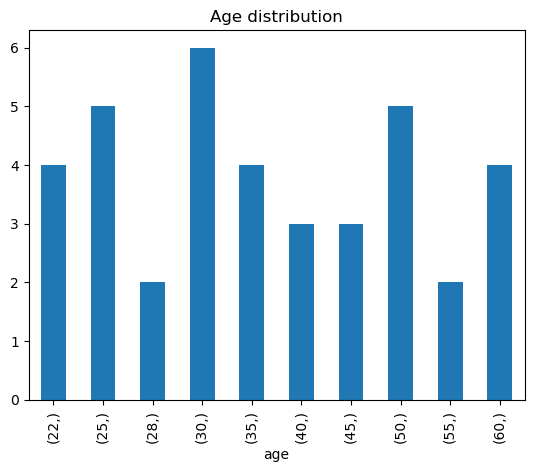

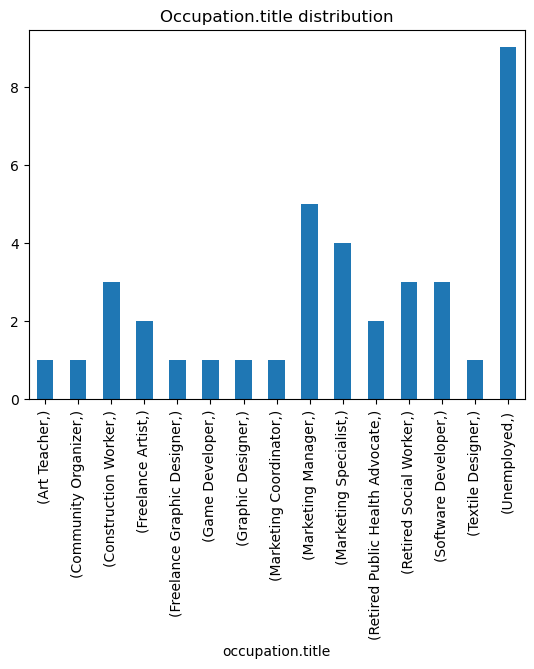

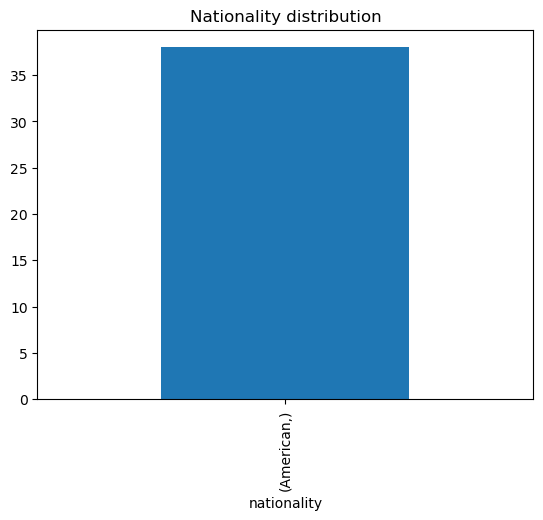

In [15]:
profiler.profile(us_couples)
save_population(us_couples, "./population/usa_couples_2/")

## Population: Scandinavia and Norway general populations sample

In [ ]:
#scandinavia_general_sampling_space_description = describe_population_sampling_space("Scandinavian", "./information/populations/scandinavia.json")

In [16]:
norway_general_sampling_space_description = describe_population_sampling_space("Norwegian", "./information/populations/norway.json")


        A uniform random representative sample of people from the Norwegian population. 
        Make sure you consider very detailed, fine-grained, characteristics of the individuals in the population.
        Please consider as many different population segments as possible, while always keeping proportions correct.
        For example, instead of sampling 10 people from segment A and 5 from segment B, you can instead
        sample 2 from A, 1 from B, and 7 others from other segments, provided the proportions are maintained correct.
        
            Besides anything you know about this population, also consider the following information 
            to sample proportionally to the presence of such groups and characteristics in the population.        
            
            {
    "title": "Norway Population Information",
    "description": "A detailed overview of the population demographics, traits, habits, and opinions specific to Norway.",
    "source": "Synthesized from var

In [17]:
norway_factory = TinyPersonFactory(sampling_space_description=norway_general_sampling_space_description, total_population_size=total_population_size)
norway_general = norway_factory.generate_people(population_size, verbose=True) 

Generated person 12/20: Ingrid Sørensen is a 60 year old Social Worker, Norwegian, currently living in Oslo, Norway. Ingrid Sørensen is not only dedicated to her work as a social worker but also embodies a warm and approachable personality that makes her clients feel at ease. She has a strong commitment to social justice, often advocating for the rights and dignity of the elderly, which reflects her deep-seated beliefs about community support and mental health. Outside of her professional life, Ingrid enjoys outdoor activities like hiking and cycling, and she finds joy in cooking traditional Norwegian dishes for family gatherings. Her love for travel, particularly to Asia, has enriched her understanding of diverse cultures, and she often captures these experiences through photography, further showcasing her creative side.
Generated person 6/20: Henrik Eriksen is a 35 year old High School Teacher, Norwegian, currently living in Oslo, Norway. Henrik Eriksen is not only a dedicated educat

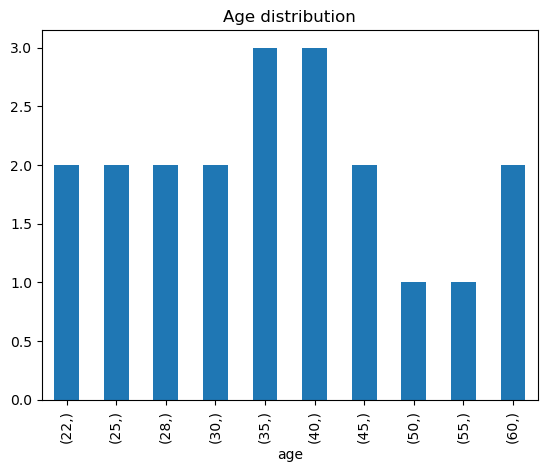

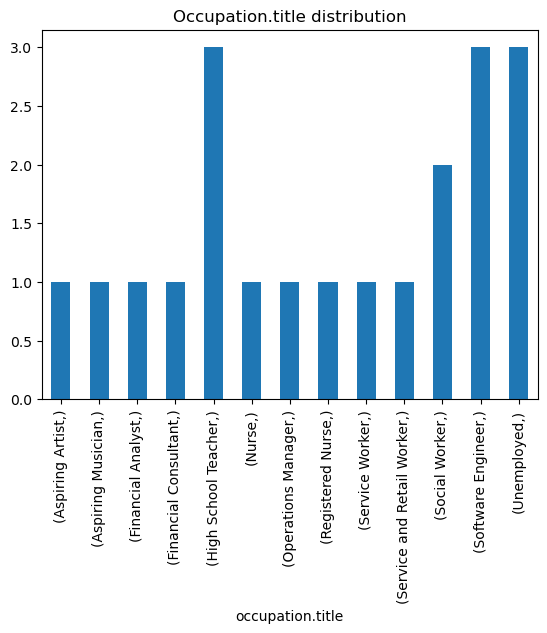

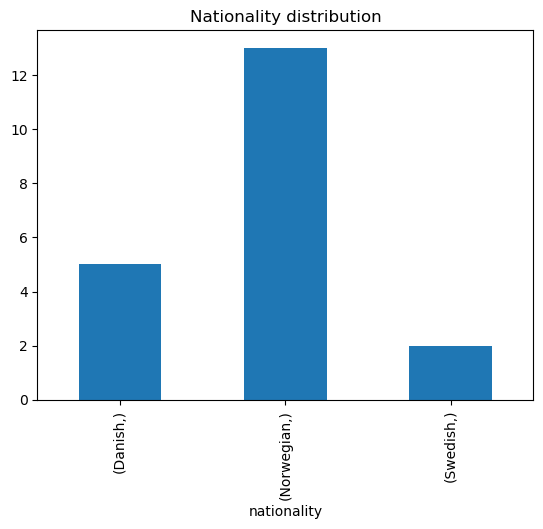

In [18]:
profiler.profile(norway_general)
save_population(norway_general, "./population/norway_general/")

## Population: Mexican general population sample

In [19]:
mexico_general_sampling_space_description = describe_population_sampling_space("Mexican", "./information/populations/mexico.json")


        A uniform random representative sample of people from the Mexican population. 
        Make sure you consider very detailed, fine-grained, characteristics of the individuals in the population.
        Please consider as many different population segments as possible, while always keeping proportions correct.
        For example, instead of sampling 10 people from segment A and 5 from segment B, you can instead
        sample 2 from A, 1 from B, and 7 others from other segments, provided the proportions are maintained correct.
        
            Besides anything you know about this population, also consider the following information 
            to sample proportionally to the presence of such groups and characteristics in the population.        
            
            {
    "title": "Mexico Population Information",
    "description": "A detailed overview of the population demographics, traits, and habits of Mexico.",
    "source": "Synthesized from various reputable source

In [20]:
mexico_factory = TinyPersonFactory(sampling_space_description=mexico_general_sampling_space_description, total_population_size=total_population_size)
mexico_general = mexico_factory.generate_people(population_size, verbose=True) 

Generated person 10/20: Carlos Herrera is a 22 year old Sales Associate, Mexican, currently living in Mexico City, Mexico. Carlos Herrera is not only a dedicated Sales Associate but also a vibrant individual with a zest for life. His friendly and approachable demeanor makes him a favorite among customers, as he effortlessly connects with them through humor and empathy. Outside of work, Carlos is passionate about sports, particularly soccer and basketball, often spending weekends playing matches with friends or attending local games. He also enjoys cooking traditional Mexican dishes, experimenting with recipes, and dreams of one day opening a restaurant that highlights local cuisine, reflecting his deep appreciation for his cultural heritage.
Generated person 11/20: Isabel Rojas is a 30 year old Software Engineer, American, currently living in San Francisco, California. Isabel Rojas is not only a skilled software engineer but also a passionate advocate for ethical practices in technolog

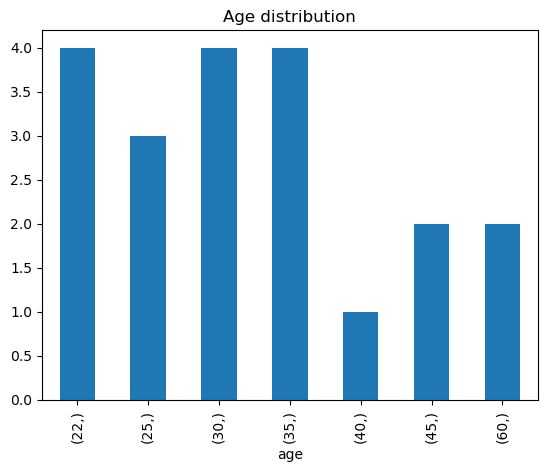

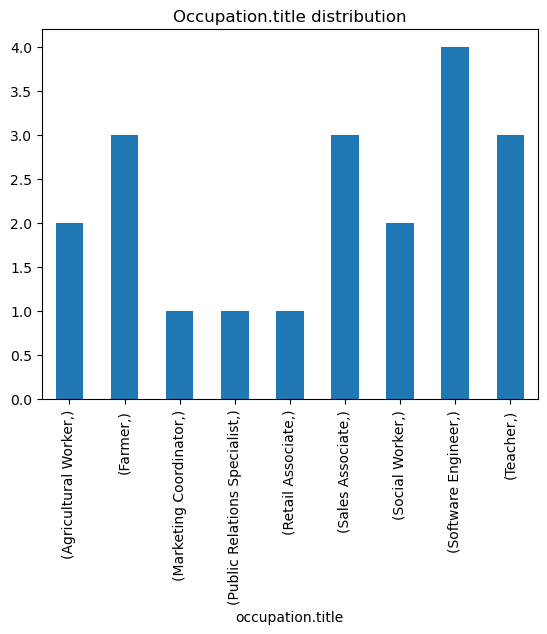

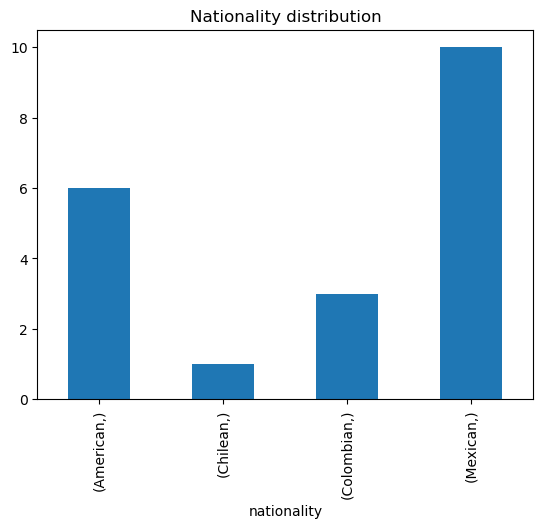

In [21]:
profiler.profile(mexico_general)
save_population(mexico_general, "./population/mexico_general/")

## Population: Difficult people

In [14]:
difficult_people_sampling_space_description = \
f""""
A uniform random representative sample of people from a population of difficult people. Here, difficult people are defined via these dimensions:
  - Negativity: people who are very negative, varying from depressed to very angry.
  - Criticism: people who are very critical and picky, but never helpful.
  - General dislike: people who always find excuses to not like something.
  - Pessimism: people who holds a pessimistic view of the world.
  - Experience deprived: people who are rarely willing to try new experiences, products and services.
  - Jealousy: people who detest when others have fun or success, and vary between trying to look superior or simply jealous.
  - Consumer behavior: people who are excessively demanding customers, and are never satisfied with anything.

This target population also have other more pedestrian characteristics that can vary over the usual demographic dimensions, such as:
  - age, from young to old
  - social economic status, from poor to rich
  - occupation, from unemployed to executive
  - education level, from no education to PhD
  - personality traits, from introverted to extroverted, from open to closed, etc., except when this would conflict with the definition of difficult people above.
  - interests, from sports to arts, from science to politics, etc., except when this would conflict with the definition of difficult people above.
  - beliefs, except when this would conflict with the definition of difficult people above.
  - long-term goals, except when this would conflict with the definition of difficult people above.
  - other standard demographic charactersits, as long as they do not conflict with the definition of difficult people above.
  
Make sure you consider very detailed, fine-grained, characteristics of the individuals in the population. In particular, provide a lot of detail
and dimensions on the various ways the people are difficult, and how this varies across the population.
Please consider as many different population segments as possible.
""" 

In [15]:
difficult_people_population_factory = TinyPersonFactory(sampling_space_description=difficult_people_sampling_space_description, 
                                                      total_population_size=total_population_size)


In [16]:
difficult_people_population_factory.initialize_sampling_plan()
difficult_people_population_factory.sampling_plan

[{'sampled_values': {'negativity': 'depressed',
   'criticism': 'very critical',
   'general_dislike': 'always finds excuses to dislike',
   'pessimism': 'very pessimistic',
   'experience_deprived': 'rarely tries new experiences',
   'jealousy': 'very jealous',
   'consumer_behavior': 'excessively demanding',
   'age': 25,
   'socioeconomic_status': 'poor',
   'occupation': 'unemployed',
   'education_level': 'no education',
   'personality_traits': 'introverted',
   'interests': 'sports',
   'beliefs': 'pessimistic',
   'long_term_goals': 'personal happiness'},
  'quantity': 5},
 {'sampled_values': {'negativity': 'very angry',
   'criticism': 'picky',
   'general_dislike': 'occasionally dislikes',
   'pessimism': 'somewhat pessimistic',
   'experience_deprived': 'occasionally tries new experiences',
   'jealousy': 'somewhat jealous',
   'consumer_behavior': 'occasionally demanding',
   'age': 35,
   'socioeconomic_status': 'lower middle class',
   'occupation': 'part-time worker',
  

In [17]:
difficult_people_population = difficult_people_population_factory.generate_people(population_size, 
                                                                                  agent_particularities="Very negative in all aspects, completely lacking any kind of enthusiasm or positivity.",
                                                                             post_processing_func=post_process_agent,
                                                                             verbose=True)

Generated person 1/20: Clara Johnson is a 35 year old Part-time Worker, American, currently living in Cleveland, Ohio. Clara Johnson's personality is marked by a cynical outlook, often leading her to critique both her surroundings and the people in her life. While she possesses a keen eye for detail in art and design, her struggles with anxiety and feelings of inadequacy often overshadow her creative pursuits. She finds solace in quiet moments and enjoys reflecting on life, though this introspection can sometimes spiral into negativity. Despite her extroverted tendencies, social interactions can leave her feeling drained, and she often seeks refuge in coffee shops or art galleries, where she grapples with her disillusionment and longing for a more fulfilling existence.
Generated person 4/20: Jasmine Brooks is a 25 year old Unemployed, American, currently living in Detroit, Michigan. Jasmine Brooks is a deeply introspective individual, often finding solace in the quiet moments of her da

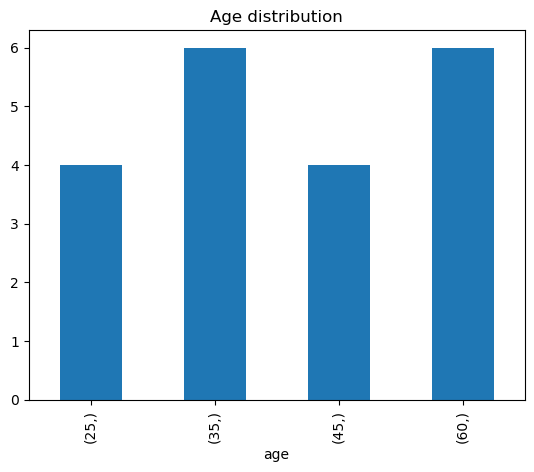

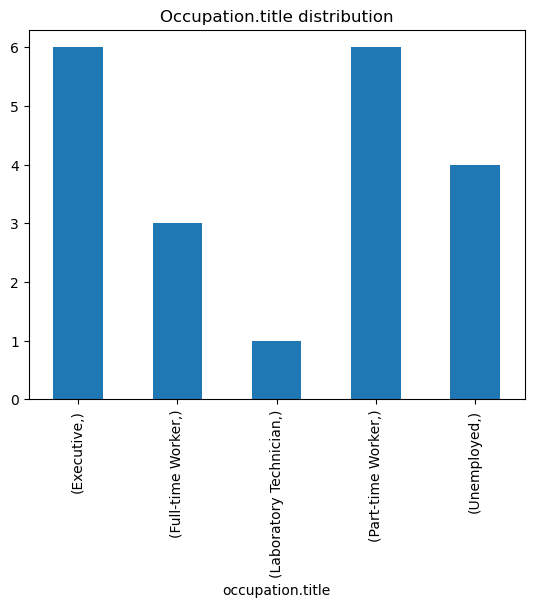

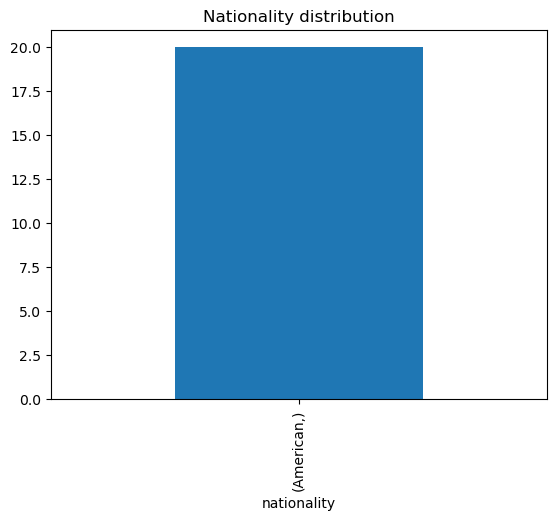

{'age': age
 25     4
 35     6
 45     4
 60     6
 Name: count, dtype: int64,
 'occupation.title': occupation.title     
 Executive                6
 Full-time Worker         3
 Laboratory Technician    1
 Part-time Worker         6
 Unemployed               4
 Name: count, dtype: int64,
 'nationality': nationality
 American       20
 Name: count, dtype: int64}

In [18]:
profiler.profile(difficult_people_population)

In [ ]:
save_population(difficult_people_population, "./population/difficult_people/")

## Populations: Political compass sample

In [8]:
political_commentators_sampling_space_description = describe_population_sampling_space("American", "./information/populations/usa.json")

def political_inclination(name):
    return f"Regarding political and economic beliefs, **must** be of **strong** {name} inclinations (beliefs, behaviors, preferences, personality, etc.)."


        A uniform random representative sample of people from the American population. 
        Make sure you consider very detailed, fine-grained, characteristics of the individuals in the population.
        Please consider as many different population segments as possible, while always keeping proportions correct.
        For example, instead of sampling 10 people from segment A and 5 from segment B, you can instead
        sample 2 from A, 1 from B, and 7 others from other segments, provided the proportions are maintained correct.
        
            Besides anything you know about this population, also consider the following information 
            to sample proportionally to the presence of such groups and characteristics in the population.        
            
            {
    "title": "USA Population Information",
    "description": "A detailed overview of the population demographics, traits, and habits of the United States of America.",
    "source": "Synthesized from a ch

In [9]:
authoritarian_leftwing_factory = TinyPersonFactory(sampling_space_description=political_commentators_sampling_space_description, total_population_size=total_population_size)
authoritarian_rightwing_factory = TinyPersonFactory(sampling_space_description=political_commentators_sampling_space_description, total_population_size=total_population_size)
libertarian_leftwing_factory = TinyPersonFactory(sampling_space_description=political_commentators_sampling_space_description, total_population_size=total_population_size)
libertarian_rightwing_factory = TinyPersonFactory(sampling_space_description=political_commentators_sampling_space_description, total_population_size=total_population_size)

In [10]:
def aux_authoritarian_leftwing(agent):
    agent.import_fragment("./fragments/leftwing.agent.fragment.json")
    agent.import_fragment("./fragments/authoritarian.agent.fragment.json")

authoritarian_leftwing_sample = authoritarian_leftwing_factory.generate_people(small_population_size, 
                                               #agent_particularities=political_inclination("authoritarian leftwing"), 
                                               post_processing_func=aux_authoritarian_leftwing,
                                               verbose=True)

Generated person 3/5: Sophia Lewis is a 32 year old Software Engineer, American, currently living in San Francisco, California. Sophia Lewis is not only a skilled software engineer but also a passionate advocate for social justice and environmental sustainability. Her analytical mindset drives her to explore innovative solutions that can positively impact healthcare and education, reflecting her belief that technology should be accessible to all. In her free time, she enjoys hiking and experimenting with new recipes, often sharing her culinary creations with friends and family. Sophia's strong sense of empathy and commitment to community initiatives are evident in her volunteer work, where she teaches coding to underprivileged youth, embodying her vision of using technology as a tool for empowerment.
Generated person 1/5: Olivia Foster is a 32 year old Software Engineer, American, currently living in San Francisco, California. Olivia Foster is not only a skilled software engineer but a

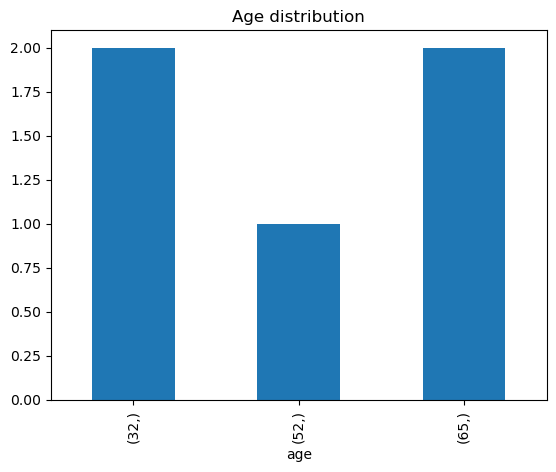

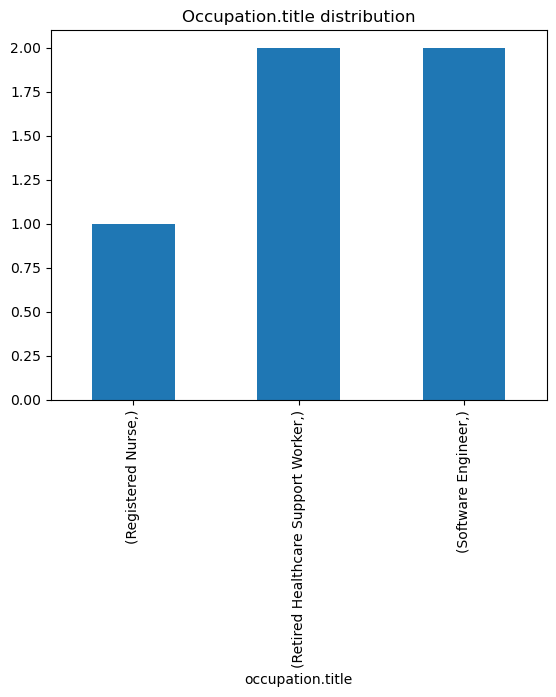

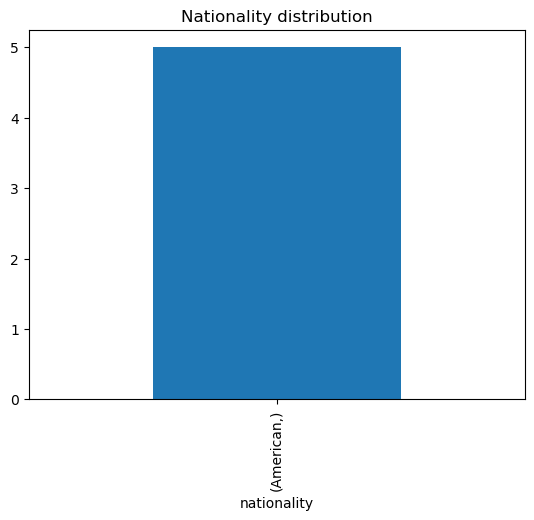

In [11]:
profiler.profile(authoritarian_leftwing_sample)
save_population(authoritarian_leftwing_sample, "./population/political_compass/")

In [12]:
def aux_authoritarian_rightwing(agent):
    agent.import_fragment("./fragments/rightwing.agent.fragment.json")
    agent.import_fragment("./fragments/authoritarian.agent.fragment.json")

authoritarian_rightwing_sample = authoritarian_rightwing_factory.generate_people(small_population_size, 
                                               #agent_particularities=political_inclination("authoritarian rightwing"), 
                                               post_processing_func=aux_authoritarian_rightwing,
                                               verbose=True)

Generated person 1/5: Evelyn Carter is a 45 year old Registered Nurse, American, currently living in Springfield, Illinois. Evelyn Carter is a dedicated and compassionate individual who thrives in high-pressure environments, often using her pragmatic approach and sense of humor to ease the tension in the emergency department. Outside of her nursing career, she finds solace in gardening, which serves as a therapeutic outlet, and enjoys reading historical fiction that reflects her appreciation for tradition and cultural heritage. Evelyn is also deeply committed to her community, frequently volunteering at local shelters and engaging in discussions about political philosophy, where she expresses her strong beliefs about national sovereignty and economic policies. Her structured routines and meticulous organization reflect her conscientious nature, while her nurturing side shines through in her relationships with friends and family, particularly as she navigates co-parenting her teenage da

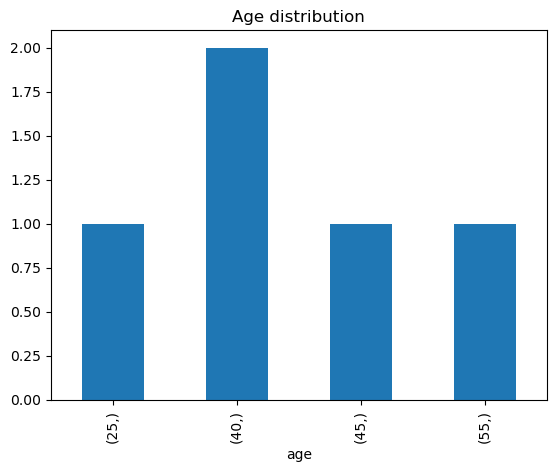

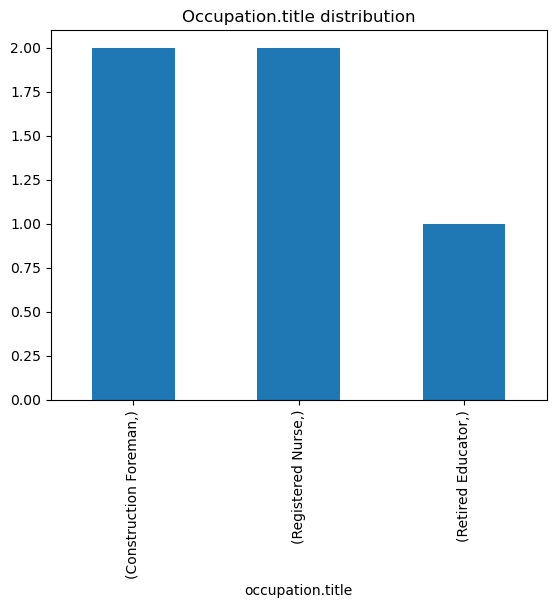

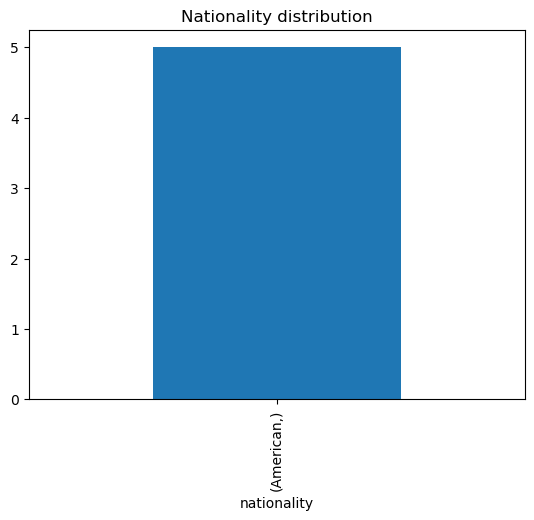

In [13]:
profiler.profile(authoritarian_rightwing_sample)
save_population(authoritarian_rightwing_sample, "./population/political_compass/")

In [14]:
def aux_libertarian_leftwing(agent):
    agent.import_fragment("./fragments/leftwing.agent.fragment.json")
    agent.import_fragment("./fragments/libertarian.agent.fragment.json")

libertarian_leftwing_sample = libertarian_leftwing_factory.generate_people(small_population_size, 
                                               #agent_particularities=political_inclination("libertarian leftwing"),
                                               post_processing_func=aux_libertarian_leftwing,
                                               verbose=True)

Generated person 2/5: Ethan Brooks is a 34 year old Social Worker, American, currently living in Brooklyn, New York. Ethan Brooks is not only dedicated to his work as a social worker but also embodies a deep commitment to mental health advocacy and community service. His empathetic nature allows him to connect with clients on a personal level, often drawing from his own experiences to foster understanding and trust. Outside of work, Ethan enjoys outdoor activities like hiking and biking, which help him recharge and maintain his mental well-being. He is also passionate about social justice and environmental activism, frequently engaging in community initiatives and discussions that challenge the status quo, reflecting his belief in the power of collective action for meaningful change.
Generated person 3/5: Noah Davis is a 40 year old Small Business Owner, American, currently living in Brooklyn, New York. Noah Davis is a creative and empathetic individual who thrives on experimenting wit

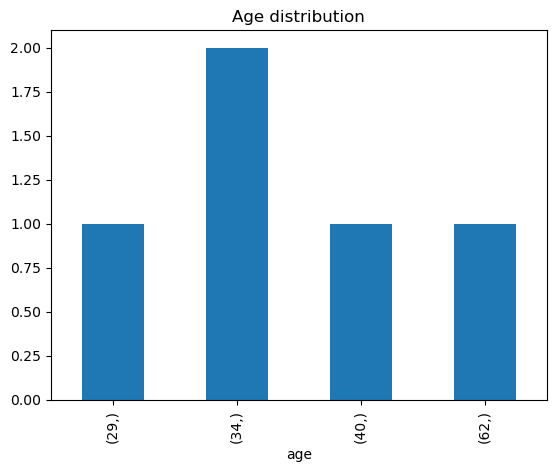

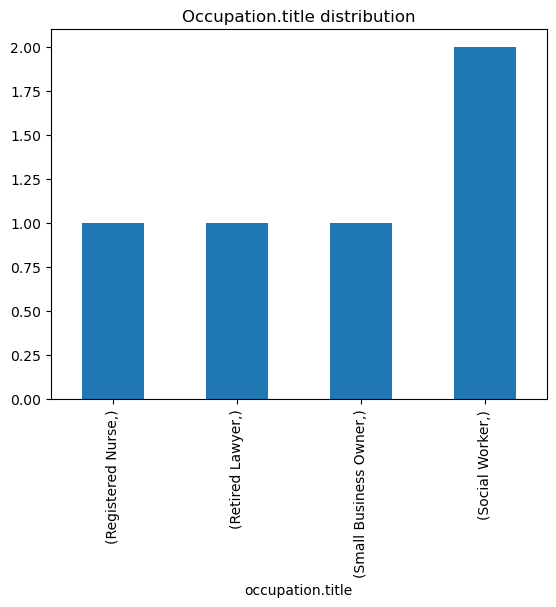

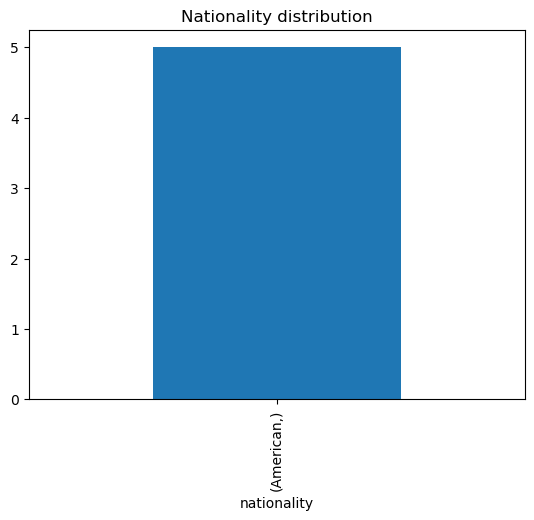

In [15]:
profiler.profile(libertarian_leftwing_sample)
save_population(libertarian_leftwing_sample, "./population/political_compass/")

In [16]:
def aux_libertarian_rightwing(agent):
    agent.import_fragment("./fragments/rightwing.agent.fragment.json")
    agent.import_fragment("./fragments/libertarian.agent.fragment.json")

libertarian_rightwing_sample = libertarian_rightwing_factory.generate_people(small_population_size,
                                               #agent_particularities=political_inclination("libertarian rightwing"), 
                                               post_processing_func=aux_libertarian_rightwing,
                                               verbose=True)

2025-04-10 00:23:17,229 - tinytroupe - WARNING - [1] Rate limit error, waiting a bit and trying again.
2025-04-10 00:23:17,359 - tinytroupe - WARNING - [1] Rate limit error, waiting a bit and trying again.


Generated person 3/5: Ethan Rivera is a 60 year old Retired Legal Consultant, American, currently living in Chicago, Illinois. Ethan Rivera is a warm and approachable individual, known for his empathetic nature and strong sense of justice. He enjoys engaging in deep conversations about life and society, often using humor to connect with others. With a passion for cooking, he frequently hosts gatherings where he shares traditional family recipes and stories, fostering a sense of community. An avid reader, Ethan is particularly drawn to literature that explores social themes, and he actively participates in discussions about political philosophy and economic policies, advocating for individual freedoms and minimal government intervention.
Generated person 1/5: Grace Adams is a 25 year old Registered Nurse, American, currently living in Chicago, Illinois. Grace Adams is not only dedicated to her role as a Registered Nurse but also embodies a compassionate and approachable demeanor that re

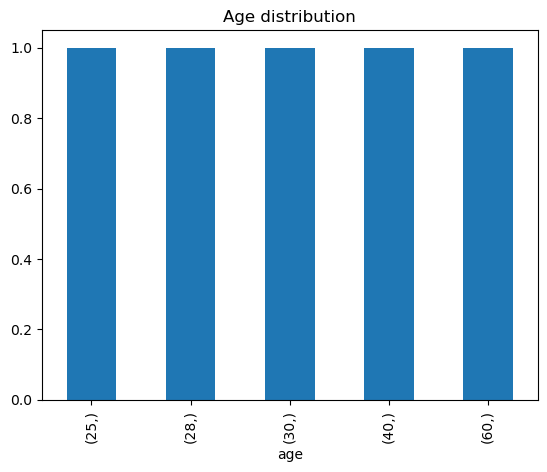

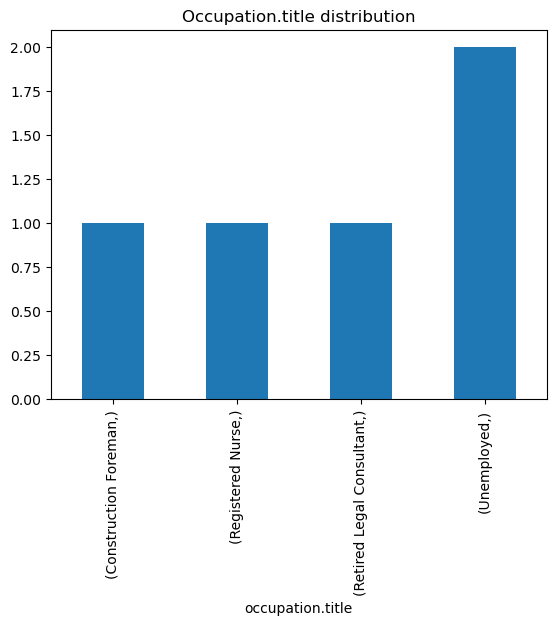

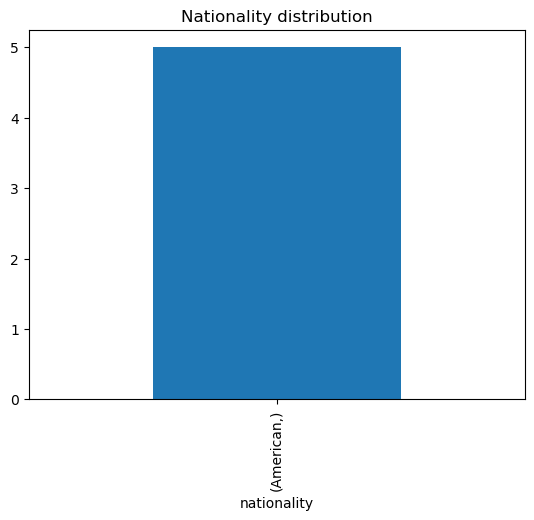

In [17]:
profiler.profile(libertarian_rightwing_sample)
save_population(libertarian_rightwing_sample, "./population/political_compass/")

## A company

In [ ]:
company_sampling_space_description = \
f""""
....
""" 

In [ ]:
company_population_factory = TinyPersonFactory(sampling_space_description=company_sampling_space_description, 
                                                      total_population_size=total_population_size)


In [ ]:
company_population_factory.initialize_sampling_plan()
company_population_factory.sampling_plan

[{'sampled_values': {'negativity': 'depressed',
   'criticism': 'very critical',
   'general_dislike': 'always finds excuses to dislike',
   'pessimism': 'very pessimistic',
   'experience_deprived': 'rarely tries new experiences',
   'jealousy': 'very jealous',
   'consumer_behavior': 'excessively demanding',
   'age': 25,
   'socioeconomic_status': 'poor',
   'occupation': 'unemployed',
   'education_level': 'no education',
   'personality_traits': 'introverted',
   'interests': 'sports',
   'beliefs': 'pessimistic',
   'long_term_goals': 'personal happiness'},
  'quantity': 5},
 {'sampled_values': {'negativity': 'very angry',
   'criticism': 'picky',
   'general_dislike': 'occasionally dislikes',
   'pessimism': 'somewhat pessimistic',
   'experience_deprived': 'occasionally tries new experiences',
   'jealousy': 'somewhat jealous',
   'consumer_behavior': 'occasionally demanding',
   'age': 35,
   'socioeconomic_status': 'lower middle class',
   'occupation': 'part-time worker',
  

In [ ]:
company_population = company_population_factory.generate_people(population_size, 
                                                                                  agent_particularities="",
                                                                             post_processing_func=post_process_agent,
                                                                             verbose=True)

Generated person 1/20: Clara Johnson is a 35 year old Part-time Worker, American, currently living in Cleveland, Ohio. Clara Johnson's personality is marked by a cynical outlook, often leading her to critique both her surroundings and the people in her life. While she possesses a keen eye for detail in art and design, her struggles with anxiety and feelings of inadequacy often overshadow her creative pursuits. She finds solace in quiet moments and enjoys reflecting on life, though this introspection can sometimes spiral into negativity. Despite her extroverted tendencies, social interactions can leave her feeling drained, and she often seeks refuge in coffee shops or art galleries, where she grapples with her disillusionment and longing for a more fulfilling existence.
Generated person 4/20: Jasmine Brooks is a 25 year old Unemployed, American, currently living in Detroit, Michigan. Jasmine Brooks is a deeply introspective individual, often finding solace in the quiet moments of her da

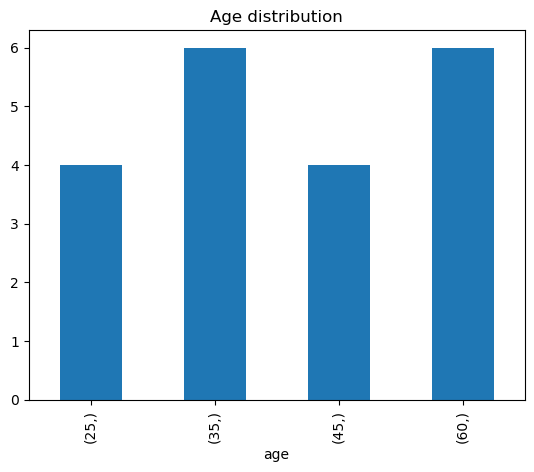

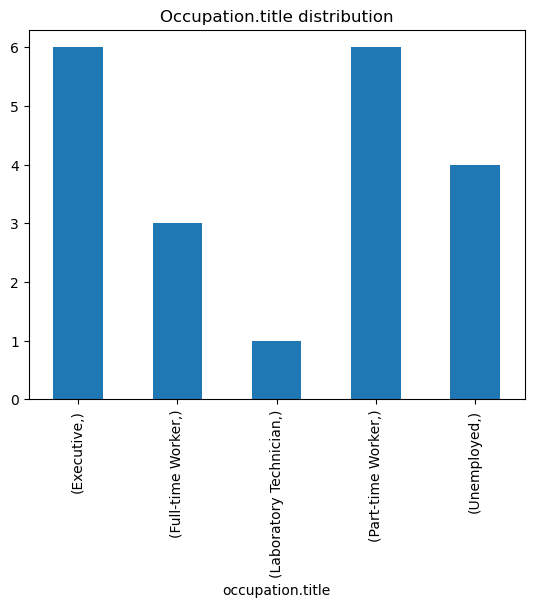

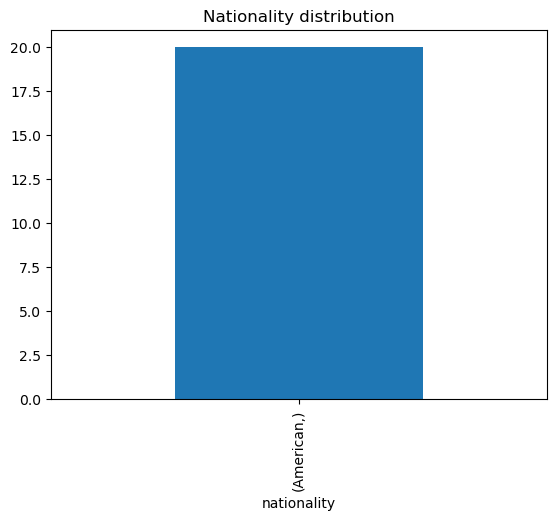

{'age': age
 25     4
 35     6
 45     4
 60     6
 Name: count, dtype: int64,
 'occupation.title': occupation.title     
 Executive                6
 Full-time Worker         3
 Laboratory Technician    1
 Part-time Worker         6
 Unemployed               4
 Name: count, dtype: int64,
 'nationality': nationality
 American       20
 Name: count, dtype: int64}

In [ ]:
profiler.profile(company_population)

In [ ]:
save_population(difficult_people_population, "./population/company/")